In [1]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms as T
import torchvision
import torch.nn.functional as F
from torch.autograd import Variable

from PIL import Image
import cv2
import albumentations as A

import time
import os
from tqdm.notebook import tqdm

!pip install -q segmentation-models-pytorch
!pip install -q torchsummary

from torchsummary import summary
import segmentation_models_pytorch as smp

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.22 (you have 1.4.21). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [2]:
IMAGE_PATH = '/kaggle/input/speed-breaker-inc-augmentation/FULL DATASET (Inc Augmentation)/Speedbreaker/images/'
MASK_PATH = '/kaggle/input/speed-breaker-inc-augmentation/FULL DATASET (Inc Augmentation)/Speedbreaker/masks/'


BG_IMAGE_PATH = '/kaggle/input/speed-breaker-dataset/FULL DATASET/Background/images/'
BG_MASK_PATH = '/kaggle/input/speed-breaker-dataset/FULL DATASET/Background/masks/'

In [3]:
n_classes = 2

def create_df():
    name = []
    for dirname, _, filenames in os.walk(IMAGE_PATH):
        for filename in filenames:
            name.append(filename.split('.')[0])
    
    return pd.DataFrame({'id': name}, index = np.arange(0, len(name)))

df = create_df()
print('Total Images: ', len(df))

Total Images:  1831


In [4]:
#split data
X_trainval, X_test = train_test_split(df['id'].values, test_size=0.1, random_state=19)
X_train, X_val = train_test_split(X_trainval, test_size=0.15, random_state=19)

print('Train Size   : ', len(X_train))
print('Val Size     : ', len(X_val))
print('Test Size    : ', len(X_test))

Train Size   :  1399
Val Size     :  248
Test Size    :  184


1231
Image Size (1080, 1920, 3)
Mask Size (1080, 1920)
Mask Size (1080, 1920)


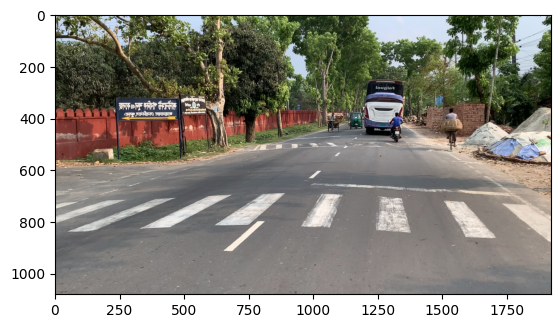

In [5]:
img = Image.open(IMAGE_PATH + df['id'][0] + '.png')
mask = Image.open(MASK_PATH + df['id'][0] + '.png')
plt.imshow(img)
print(df['id'][0])
import cv2

# Load your RGB image
rgb_image = cv2.imread(MASK_PATH + df['id'][0] + '.png')

# Convert to grayscale using OpenCV
gray_image = cv2.cvtColor(rgb_image, cv2.COLOR_RGB2GRAY)

img=np.asarray(img)
#mask= np.asarray(mask)/255
print('Image Size', np.asarray(img).shape)
print('Mask Size', np.asarray(mask).shape)

print('Mask Size', np.asarray(gray_image).shape)


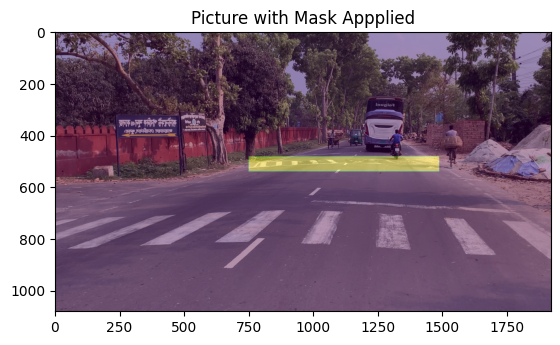

In [6]:
plt.imshow(img)
plt.imshow(gray_image, alpha=0.4)
plt.title('Picture with Mask Appplied')
plt.show()

In [7]:
class Dataset_create(Dataset):
    
    def __init__(self, img_path, mask_path, X, mean, std, transform=None, patch=False):
        self.img_path = img_path
        self.mask_path = mask_path
        self.X = X
        self.transform = transform
        self.patches = patch
        self.mean = mean
        self.std = std
        
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        img = cv2.imread(self.img_path + self.X[idx] + '.png')
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(self.mask_path + self.X[idx] + '.png', cv2.IMREAD_GRAYSCALE)
         
        
        if self.transform is not None:
            aug = self.transform(image=img, mask=mask)
            img = Image.fromarray(aug['image'])
            mask = aug['mask']
        
        if self.transform is None:
            img = Image.fromarray(img)
        
       

        t = T.Compose([T.ToTensor(), T.Normalize(self.mean, self.std)])
        img = t(img)
        
        #extra to make 128,128 to 128,128,1
        # Add an extra dimension to convert it to (128, 128, 1)
        mask = mask[:, :, np.newaxis]
        t2 = T.Compose([T.ToTensor()])
        mask = t2(mask)
        
        
        #print(mask.shape)
        #mask = torch.from_numpy(mask).long()
        #mask = mask.long()
        
        if self.patches:
            img, mask = self.tiles(img, mask)
            
        return img, mask
    
    def tiles(self, img, mask):

        img_patches = img.unfold(1,  64,64).unfold(2,  64,64) 
        #print("ok")
        img_patches  = img_patches.contiguous().view(3,-1,  64,64) 
        #print("ok2")
        img_patches = img_patches.permute(1,0,2,3)
        #print("ok3")
        
        mask_patches = mask.unfold(1,  64,64).unfold(2,  64,64)
        mask_patches = mask_patches.contiguous().view(1,-1,  64,64)
        mask_patches = mask_patches.permute(1,0,2,3)
        
        return img_patches, mask_patches

In [8]:
mean=[0.485, 0.456, 0.406]
std=[0.229, 0.224, 0.225]

t_train = A.Compose([A.Resize(512,512, interpolation=cv2.INTER_NEAREST), A.HorizontalFlip(), A.VerticalFlip(), 
                     A.GridDistortion(p=0.2), A.RandomBrightnessContrast((0,0.5),(0,0.5)),
                     A.GaussNoise()])

t_val = A.Compose([A.Resize(512,512, interpolation=cv2.INTER_NEAREST), A.HorizontalFlip(),
                   A.GridDistortion(p=0.2)])

#datasets
train_set = Dataset_create(IMAGE_PATH, MASK_PATH, X_train, mean, std, t_train, patch=False)
val_set = Dataset_create(IMAGE_PATH, MASK_PATH, X_val, mean, std, t_val, patch=False)
test_set = Dataset_create(IMAGE_PATH, MASK_PATH, X_test, mean, std, t_val, patch=False)

#dataloader
batch_size= 8

train_loader = DataLoader(train_set, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_set, batch_size=4, shuffle=True)    
test_loader = DataLoader(test_set, batch_size=4, shuffle=False) #Make this false for test    

In [9]:
#print(val_loader)

Total Images:  458
Image Size (1080, 1920, 3)
Mask Size (1080, 1920, 3)
Mask Size (1080, 1920)


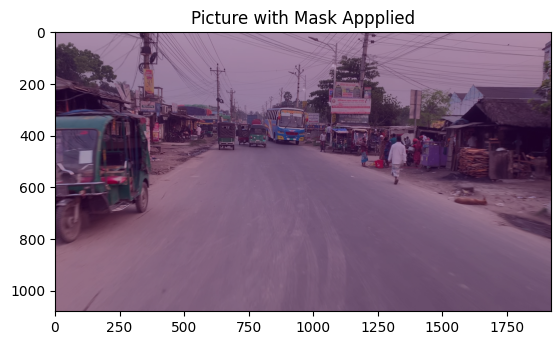

Total bg image 183
Total bg image batch 46


In [10]:
#for background

def create_df2():
    name = []
    for dirname, _, filenames in os.walk(BG_IMAGE_PATH):
        for filename in filenames:
            name.append(filename.split('.')[0])
    
    return pd.DataFrame({'id': name}, index = np.arange(0, len(name)))

df2 = create_df2()
print('Total Images: ', len(df2))

bg_img = Image.open(BG_IMAGE_PATH + df2['id'][173] + '.png')
bg_mask = Image.open(BG_MASK_PATH + df2['id'][173] + '.png')
import cv2

# Load your RGB image
bg_rgb_image = cv2.imread(BG_MASK_PATH + df2['id'][173] + '.png')

# Convert to grayscale using OpenCV
bg_gray_image = cv2.cvtColor(bg_rgb_image, cv2.COLOR_RGB2GRAY)

bg_img=np.asarray(bg_img)
#mask= np.asarray(mask)/255
print('Image Size', np.asarray(bg_img).shape)
print('Mask Size', np.asarray(bg_mask).shape)

print('Mask Size', np.asarray(bg_gray_image).shape)

plt.imshow(bg_img)
plt.imshow(bg_gray_image, alpha=0.4)
plt.title('Picture with Mask Appplied')
plt.show()

bg_bg, _____ = train_test_split(df2['id'].values, test_size=0.6, random_state=19)


bg_test_set = Dataset_create(BG_IMAGE_PATH, BG_MASK_PATH, bg_bg, mean, std, t_val, patch=False)

#dataloader
batch_size= 8
print('Total bg image', len(bg_test_set));
bg_test_loader = DataLoader(bg_test_set, batch_size=4, shuffle=False)   
print('Total bg image batch', len(bg_test_loader));

In [11]:
import torch
from torch.utils.data import DataLoader


# Assuming each batch contains image and mask tensors
for batch_idx, (images, masks) in enumerate(train_loader):
    # Print the shape of the first batch
    if batch_idx == 0:
        print("Image batch shape:", images.shape)
        print("Mask batch shape:", masks.shape)
    
    # Break after the first batch if you only want to print one iteration
    break


Image batch shape: torch.Size([8, 3, 512, 512])
Mask batch shape: torch.Size([8, 1, 512, 512])


In [12]:
im , mk = train_set[6]
myfiles=[im,mk]
print(mk.shape)
print(im.shape)

torch.Size([1, 512, 512])
torch.Size([3, 512, 512])


In [13]:
import numpy as np
import pandas as pd
import os , glob
import matplotlib.pyplot as plt
from PIL import Image
import cv2
from tqdm import tqdm

import torch
from torch import Tensor
from torch.autograd import Function
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from keras.preprocessing import image
import albumentations as A
from albumentations.pytorch import ToTensorV2

from torch.utils.data import Dataset , DataLoader
from torchvision import transforms , utils , datasets

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [14]:
class DoubleConv(nn.Module):

    def __init__(self, in_channels, out_channels, mid_channels=None):
        
        super().__init__()
        
        if not mid_channels:
            mid_channels = out_channels
        
        self.double_conv = nn.Sequential(
            
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(mid_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)
    
    
    
class Down(nn.Module):

    def __init__(self, in_channels, out_channels):
        super().__init__()
        
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):
        return self.maxpool_conv(x)
    
    
class Up(nn.Module):

    def __init__(self, in_channels, out_channels, bilinear=True):
        super().__init__()

        # if bilinear, use the normal convolutions to reduce the number of channels
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
            self.conv = DoubleConv(in_channels, out_channels, in_channels // 2)
        else:
            self.up = nn.ConvTranspose2d(in_channels , in_channels // 2, kernel_size=2, stride=2)
            self.conv = DoubleConv(in_channels, out_channels)


    def forward(self, x1, x2):
        x1 = self.up(x1)
        # input is CHW
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])
        # if you have padding issues, see
        # https://github.com/HaiyongJiang/U-Net-Pytorch-Unstructured-Buggy/commit/0e854509c2cea854e247a9c615f175f76fbb2e3a
        # https://github.com/xiaopeng-liao/Pytorch-UNet/commit/8ebac70e633bac59fc22bb5195e513d5832fb3bd
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)


class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x):
        return self.conv(x)
    
    
    
class UNet(nn.Module):
    def __init__(self, n_channels, n_classes, bilinear=True):
        super(UNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear

        self.inc = DoubleConv(n_channels, 64)
        self.down1 = Down(64, 128)
        self.down2 = Down(128, 256)
        self.down3 = Down(256, 512)
        factor = 2 if bilinear else 1
        self.down4 = Down(512, 1024 // factor)
        self.up1 = Up(1024, 512 // factor, bilinear)
        self.up2 = Up(512, 256 // factor, bilinear)
        self.up3 = Up(256, 128 // factor, bilinear)
        self.up4 = Up(128, 64, bilinear)
        self.outc = OutConv(64, n_classes)

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        logits = self.outc(x)
        return logits



In [15]:
# # test inceptionv4
# import torch

# # Manually download the weights file from the provided URL
# weights_url = "http://data.lip6.fr/cadene/pretrainedmodels/inceptionv4-8e4777a0.pth"
# local_weights_file = "inceptionv4.pth"
# torch.hub.download_url_to_file(weights_url, local_weights_file)

# # Now load the weights from the local file
# net = smp.Unet('inceptionv4', encoder_weights=None, classes=1, activation=None, encoder_depth=5, decoder_channels=[256, 128, 64, 32, 16])
# state_dict = torch.load(local_weights_file)
# net.encoder.load_state_dict(state_dict)


In [16]:
net=smp.Unet('mobilenet_v2', encoder_weights='imagenet', classes=1, activation=None, encoder_depth=5, decoder_channels=[ 256, 128, 64, 32, 16])

# import segmentation_models_pytorch as smp

# net = smp.Unet(
#     'efficientnet-b3',
#     encoder_weights='imagenet',
#     classes=1,
#     activation='sigmoid',  # Set activation to 'sigmoid' for binary classification
#     encoder_depth=5,
#     decoder_channels=[256, 128, 64, 32, 16]
# )
pretrain = False
if pretrain:
# Load the saved weights
    net.load_state_dict(torch.load('/kaggle/input/weights-all/speed_breaker_weights_mobilenet_v2.pth'))

Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 129MB/s]


In [17]:
#net = UNet(n_channels=3, n_classes=1, bilinear=True)
net.to(device=device)

Unet(
  (encoder): MobileNetV2Encoder(
    (features): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU6(inplace=True)
      )
      (1): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU6(inplace=True)
          )
          (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
      )
      (2): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 96, kernel_size=(1

In [18]:



optimizer = optim.RMSprop(net.parameters(), lr=0.0001, weight_decay=1e-8, momentum=0.9)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer,  'max', patience=2)
criterion = nn.BCEWithLogitsLoss()
# if net.n_classes > 1:
#     criterion = nn.CrossEntropyLoss()
# else:
#     criterion = nn.BCEWithLogitsLoss()

In [19]:
def dice_calc(gt,pred) :
    pred = torch.sigmoid(pred)
    pred = ((pred) >= .5).float()
    dice_score = (2 * (pred * gt).sum()) / ((pred + gt).sum() + 1e-8)
    
    return dice_score

In [20]:

def train(epoch,epochs,tloader) :
    net.train()
    
    tloader.set_description(f'EPOCH {epoch}')
    epoch_loss = 0
    dice_score = 0
    num_correct = 0    
    
    for images , masks in tloader :
 
        optimizer.zero_grad()
        images = images.to(device, dtype=torch.float32)
        masks  = masks.to(device, dtype=torch.float32)
        mask_pred = net(images)

        loss = criterion(mask_pred,masks)
        epoch_loss += loss.item()      
        loss.backward()
        optimizer.step()
    
        running_DS = dice_calc(masks,mask_pred)
        dice_score += running_DS
                
        tloader.set_postfix(loss=loss.item(),accuracy=(running_DS.item()))
    print(' Train Dice Score Epoch : ',dice_score/len(train_loader))
    
def validation(vloader) :
    net.eval()
    vloader.set_description('Validation')
    
    n_val = len(val_loader)
    total = 0
    dice_score = 0
    num_correct = 0
    
    with torch.no_grad():
        for images ,masks in vloader :

            images = images.to(device)
            masks  = masks.to(device)
                
            mask_pred = net(images)
            
            loss = criterion(mask_pred,masks)
            
            running_DS = dice_calc(masks,mask_pred)
            dice_score += running_DS
            
            vloader.set_postfix(loss=loss.item(),accuracy=(running_DS.item()))
        
    print('Validation Dice Score Epoch : ',dice_score/len(val_loader))
            

In [21]:
#worked fine
import torch
import torch.optim as optim
import torch.nn as nn
import torchvision.transforms as transforms
import numpy as np
from tqdm import tqdm

# Define the Dice Score calculation function
def dice_calc(gt, pred):
    pred = torch.sigmoid(pred)
    pred = (pred >= 0.5).float()
    intersection = (pred * gt).sum()
    union = (pred + gt).sum() + 1e-8
    dice_score = (2 * intersection) / union
    return dice_score

# Define the IoU calculation function
def iou_calc(gt, pred):
    pred = torch.sigmoid(pred)
    pred = (pred >= 0.5).float()
    intersection = (pred * gt).sum()
    union = (pred + gt).sum() - intersection + 1e-8
    iou_score = intersection / union
    return iou_score

# Define your model, optimizer, and loss criterion
device = torch.device("cuda:0")
#net = UNet(n_channels=3, n_classes=1, bilinear=True)
net.to(device=device)
optimizer = optim.RMSprop(net.parameters(), lr=0.0001, weight_decay=1e-8, momentum=0.9)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'max', patience=2)
criterion = nn.BCEWithLogitsLoss()

# Training loop
def train(epoch, epochs, tloader):
    net.train()
    tloader.set_description(f'EPOCH {epoch}')
    epoch_loss = 0
    dice_score = 0
    iou_score = 0
    
    for images, masks in tloader:
        optimizer.zero_grad()
        images = images.to(device, dtype=torch.float32)
        masks = masks.to(device, dtype=torch.float32)
        mask_pred = net(images)
        
        loss = criterion(mask_pred, masks)
        epoch_loss += loss.item()
        loss.backward()
        optimizer.step()
        
        running_DS = dice_calc(masks, mask_pred)
        dice_score += running_DS
        running_IOU = iou_calc(masks, mask_pred)
        iou_score += running_IOU
        
        tloader.set_postfix(loss=loss.item(), dice_score=running_DS.item(), iou_score=running_IOU.item())
    
    print(f'Train Dice Score Epoch: {dice_score / len(tloader)}')
    print(f'Train IoU Score Epoch: {iou_score / len(tloader)}')

# Validation loop
def validation(vloader):
    net.eval()
    vloader.set_description('Validation')
    
    dice_score = 0
    iou_score = 0
    
    with torch.no_grad():
        for images, masks in vloader:
            images = images.to(device)
            masks = masks.to(device)
            mask_pred = net(images)
            
            running_DS = dice_calc(masks, mask_pred)
            dice_score += running_DS
            running_IOU = iou_calc(masks, mask_pred)
            iou_score += running_IOU
            
            vloader.set_postfix(dice_score=running_DS.item(), iou_score=running_IOU.item())
        
    print(f'Validation Dice Score Epoch: {dice_score / len(vloader)}')
    print(f'Validation IoU Score Epoch: {iou_score / len(vloader)}')


In [22]:
import torch.nn.functional as F

class CustomLoss(nn.Module):
    def __init__(self, weight_ce=0.000):
        super(CustomLoss, self).__init__()
        self.weight_ce = weight_ce

    def forward(self, pred, target):
        # Calculate Dice Loss
        pred_sigmoid = torch.sigmoid(pred)
        dice_numerator = 2 * torch.sum(pred_sigmoid * target)
        dice_denominator = torch.sum(pred_sigmoid.pow(2) + target.pow(2))
        dice_loss = 1 - dice_numerator / (dice_denominator + 1e-8)

        # Calculate Cross-Entropy Loss
        ce_loss = F.binary_cross_entropy_with_logits(pred, target)

        # Combine Dice Loss and Cross-Entropy Loss
        loss = self.weight_ce * ce_loss + (1 - self.weight_ce) * dice_loss

        return loss

# Create an instance of the custom loss
custom_loss = CustomLoss(weight_ce=0.000)


In [23]:
#patch try
import torch
import torch.optim as optim
import torch.nn as nn
import torchvision.transforms as transforms
import numpy as np
from tqdm import tqdm

# Define the Dice Score calculation function
def dice_calc(gt, pred):
    pred = torch.sigmoid(pred)
    pred = (pred >= 0.5).float()
    intersection = (pred * gt).sum()
    union = (pred + gt).sum() + 1e-8
    dice_score = (2 * intersection) / union
    return dice_score

# Define the IoU calculation function
def iou_calc(gt, pred):
    pred = torch.sigmoid(pred)
    pred = (pred >= 0.5).float()
    intersection = (pred * gt).sum()
    union = (pred + gt).sum() - intersection + 1e-8
    iou_score = intersection / union
    return iou_score

# Define your model, optimizer, and loss criterion
device = torch.device("cuda:0")
#net = UNet(n_channels=3, n_classes=1, bilinear=True)
net.to(device=device)
optimizer = optim.RMSprop(net.parameters(), lr=0.0001, weight_decay=1e-8, momentum=0.9)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'max', patience=2)
criterion = nn.BCEWithLogitsLoss()
criterion = CustomLoss(weight_ce=0.875)
# Training loop
def train(epoch, epochs, tloader, patch=False):
    net.train()
    tloader.set_description(f'EPOCH {epoch}')
    epoch_loss = 0
    dice_score = 0
    iou_score = 0
    
    for images, masks in tloader:
        optimizer.zero_grad()
        images = images.to(device, dtype=torch.float32)
        masks = masks.to(device, dtype=torch.float32)
        
        if patch:
            # Perform patch-wise training
            batch_size, num_patches, num_channels, height, width = images.shape
            images = images.view(-1, num_channels, height, width)
            masks = masks.view(-1, 1, height, width)
            
        mask_pred = net(images)
        
        loss = criterion(mask_pred, masks)
        epoch_loss += loss.item()
        loss.backward()
        optimizer.step()
        
        running_DS = dice_calc(masks, mask_pred)
        dice_score += running_DS
        running_IOU = iou_calc(masks, mask_pred)
        iou_score += running_IOU
        
        tloader.set_postfix(loss=loss.item(), dice_score=running_DS.item(), iou_score=running_IOU.item())
    
    print(f'Train Dice Score Epoch: {dice_score / len(tloader)}')
    print(f'Train IoU Score Epoch: {iou_score / len(tloader)}')
    return dice_score / len(tloader)

# Validation loop
def validation(vloader, patch=False):
    net.eval()
    vloader.set_description('Validation')
    
    dice_score = 0
    iou_score = 0
    
    with torch.no_grad():
        for images, masks in vloader:
            images = images.to(device)
            masks = masks.to(device)
            
            if patch:
                # Perform patch-wise validation
                batch_size, num_patches, num_channels, height, width = images.shape
                images = images.view(-1, num_channels, height, width)
                masks = masks.view(-1, 1, height, width)
                
            mask_pred = net(images)
            
            running_DS = dice_calc(masks, mask_pred)
            dice_score += running_DS
            running_IOU = iou_calc(masks, mask_pred)
            iou_score += running_IOU
            
            vloader.set_postfix(dice_score=running_DS.item(), iou_score=running_IOU.item())
        
    print(f'Validation Dice Score Epoch: {dice_score / len(vloader)}')
    print(f'Validation IoU Score Epoch: {iou_score / len(vloader)}')
    return dice_score / len(vloader)


In [24]:
epochs = 45
train_dice_scores = []
val_dice_scores = []

for epoch in range(epochs):
    print(epoch+1, '/', epochs)
    with tqdm(train_loader, unit='batch') as tloader: 
        train_dice_score = train(epoch, epochs, tloader, patch=False)
        train_dice_scores.append(train_dice_score)
    
    with tqdm(val_loader, unit='batch') as vloader:
        val_dice_score = validation(vloader, patch=False)
        val_dice_scores.append(val_dice_score)

1 / 45


EPOCH 0: 100%|██████████| 175/175 [05:13<00:00,  1.79s/batch, dice_score=0.174, iou_score=0.0955, loss=0.198]


Train Dice Score Epoch: 0.16946804523468018
Train IoU Score Epoch: 0.10538327693939209


Validation: 100%|██████████| 62/62 [00:46<00:00,  1.32batch/s, dice_score=0.632, iou_score=0.462]


Validation Dice Score Epoch: 0.40123969316482544
Validation IoU Score Epoch: 0.26465490460395813
2 / 45


EPOCH 1: 100%|██████████| 175/175 [04:42<00:00,  1.61s/batch, dice_score=0.593, iou_score=0.422, loss=0.121]


Train Dice Score Epoch: 0.4158724844455719
Train IoU Score Epoch: 0.2760733664035797


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.50batch/s, dice_score=0.711, iou_score=0.551]


Validation Dice Score Epoch: 0.4984951913356781
Validation IoU Score Epoch: 0.36324048042297363
3 / 45


EPOCH 2: 100%|██████████| 175/175 [04:40<00:00,  1.60s/batch, dice_score=0.429, iou_score=0.273, loss=0.109]


Train Dice Score Epoch: 0.47315436601638794
Train IoU Score Epoch: 0.32314416766166687


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.50batch/s, dice_score=0.656, iou_score=0.488]


Validation Dice Score Epoch: 0.6015440225601196
Validation IoU Score Epoch: 0.44385483860969543
4 / 45


EPOCH 3: 100%|██████████| 175/175 [04:41<00:00,  1.61s/batch, dice_score=0.666, iou_score=0.499, loss=0.0889]


Train Dice Score Epoch: 0.5040215849876404
Train IoU Score Epoch: 0.3525882065296173


Validation: 100%|██████████| 62/62 [00:40<00:00,  1.51batch/s, dice_score=0.615, iou_score=0.445]


Validation Dice Score Epoch: 0.5802174210548401
Validation IoU Score Epoch: 0.42366480827331543
5 / 45


EPOCH 4: 100%|██████████| 175/175 [04:41<00:00,  1.61s/batch, dice_score=0.644, iou_score=0.474, loss=0.0825]


Train Dice Score Epoch: 0.5248199701309204
Train IoU Score Epoch: 0.3704231381416321


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.51batch/s, dice_score=0, iou_score=0]


Validation Dice Score Epoch: 0.552330493927002
Validation IoU Score Epoch: 0.4184719920158386
6 / 45


EPOCH 5: 100%|██████████| 175/175 [04:40<00:00,  1.60s/batch, dice_score=0.617, iou_score=0.447, loss=0.08]


Train Dice Score Epoch: 0.5415592789649963
Train IoU Score Epoch: 0.3853817284107208


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.50batch/s, dice_score=0.612, iou_score=0.441]


Validation Dice Score Epoch: 0.5295125842094421
Validation IoU Score Epoch: 0.3967931568622589
7 / 45


EPOCH 6: 100%|██████████| 175/175 [04:41<00:00,  1.61s/batch, dice_score=0.705, iou_score=0.545, loss=0.057]


Train Dice Score Epoch: 0.5516429543495178
Train IoU Score Epoch: 0.39797472953796387


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.49batch/s, dice_score=0.831, iou_score=0.711]


Validation Dice Score Epoch: 0.5815660953521729
Validation IoU Score Epoch: 0.4479755163192749
8 / 45


EPOCH 7: 100%|██████████| 175/175 [04:40<00:00,  1.60s/batch, dice_score=0.525, iou_score=0.356, loss=0.113]


Train Dice Score Epoch: 0.5570670962333679
Train IoU Score Epoch: 0.4012182652950287


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.51batch/s, dice_score=0.0484, iou_score=0.0248]


Validation Dice Score Epoch: 0.569313645362854
Validation IoU Score Epoch: 0.4323326349258423
9 / 45


EPOCH 8: 100%|██████████| 175/175 [04:40<00:00,  1.60s/batch, dice_score=0.547, iou_score=0.376, loss=0.08]


Train Dice Score Epoch: 0.5769179463386536
Train IoU Score Epoch: 0.41873905062675476


Validation: 100%|██████████| 62/62 [00:40<00:00,  1.52batch/s, dice_score=0.773, iou_score=0.63]


Validation Dice Score Epoch: 0.650326669216156
Validation IoU Score Epoch: 0.5029920339584351
10 / 45


EPOCH 9: 100%|██████████| 175/175 [04:40<00:00,  1.60s/batch, dice_score=0.334, iou_score=0.2, loss=0.172]


Train Dice Score Epoch: 0.6045417189598083
Train IoU Score Epoch: 0.44995975494384766


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.50batch/s, dice_score=0.707, iou_score=0.547]


Validation Dice Score Epoch: 0.649364173412323
Validation IoU Score Epoch: 0.5033131241798401
11 / 45


EPOCH 10: 100%|██████████| 175/175 [04:41<00:00,  1.61s/batch, dice_score=0.392, iou_score=0.244, loss=0.108]


Train Dice Score Epoch: 0.6003777980804443
Train IoU Score Epoch: 0.44397860765457153


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.50batch/s, dice_score=0.815, iou_score=0.688]


Validation Dice Score Epoch: 0.5986034274101257
Validation IoU Score Epoch: 0.4568836987018585
12 / 45


EPOCH 11: 100%|██████████| 175/175 [04:40<00:00,  1.61s/batch, dice_score=0.621, iou_score=0.451, loss=0.0716]


Train Dice Score Epoch: 0.609795331954956
Train IoU Score Epoch: 0.4545423984527588


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.50batch/s, dice_score=0.691, iou_score=0.528]


Validation Dice Score Epoch: 0.6954261660575867
Validation IoU Score Epoch: 0.5480448603630066
13 / 45


EPOCH 12: 100%|██████████| 175/175 [04:42<00:00,  1.62s/batch, dice_score=0.669, iou_score=0.502, loss=0.0577]


Train Dice Score Epoch: 0.640661895275116
Train IoU Score Epoch: 0.4852764308452606


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.50batch/s, dice_score=0.825, iou_score=0.702]


Validation Dice Score Epoch: 0.7040795683860779
Validation IoU Score Epoch: 0.5608905553817749
14 / 45


EPOCH 13: 100%|██████████| 175/175 [04:42<00:00,  1.61s/batch, dice_score=0.777, iou_score=0.636, loss=0.0694]


Train Dice Score Epoch: 0.6371654272079468
Train IoU Score Epoch: 0.4833797216415405


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.49batch/s, dice_score=0.734, iou_score=0.58]


Validation Dice Score Epoch: 0.6780098676681519
Validation IoU Score Epoch: 0.5365025997161865
15 / 45


EPOCH 14: 100%|██████████| 175/175 [04:41<00:00,  1.61s/batch, dice_score=0.678, iou_score=0.513, loss=0.0515]


Train Dice Score Epoch: 0.6464750170707703
Train IoU Score Epoch: 0.49370312690734863


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.49batch/s, dice_score=0.714, iou_score=0.555]


Validation Dice Score Epoch: 0.6271429657936096
Validation IoU Score Epoch: 0.4897580146789551
16 / 45


EPOCH 15: 100%|██████████| 175/175 [04:43<00:00,  1.62s/batch, dice_score=0.708, iou_score=0.548, loss=0.0864]


Train Dice Score Epoch: 0.6556760668754578
Train IoU Score Epoch: 0.5046828985214233


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.50batch/s, dice_score=0.866, iou_score=0.764]


Validation Dice Score Epoch: 0.7144755721092224
Validation IoU Score Epoch: 0.5734847187995911
17 / 45


EPOCH 16: 100%|██████████| 175/175 [04:42<00:00,  1.61s/batch, dice_score=0.64, iou_score=0.47, loss=0.0644]


Train Dice Score Epoch: 0.6618459820747375
Train IoU Score Epoch: 0.5119780898094177


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.51batch/s, dice_score=0.729, iou_score=0.574]


Validation Dice Score Epoch: 0.6621921062469482
Validation IoU Score Epoch: 0.5253020524978638
18 / 45


EPOCH 17: 100%|██████████| 175/175 [04:42<00:00,  1.61s/batch, dice_score=0.666, iou_score=0.499, loss=0.0716]


Train Dice Score Epoch: 0.6845179200172424
Train IoU Score Epoch: 0.5339027643203735


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.49batch/s, dice_score=0.778, iou_score=0.636]


Validation Dice Score Epoch: 0.7121748328208923
Validation IoU Score Epoch: 0.5668638348579407
19 / 45


EPOCH 18: 100%|██████████| 175/175 [04:42<00:00,  1.61s/batch, dice_score=0.76, iou_score=0.613, loss=0.0475]


Train Dice Score Epoch: 0.6757476925849915
Train IoU Score Epoch: 0.5260728001594543


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.51batch/s, dice_score=0.866, iou_score=0.763]


Validation Dice Score Epoch: 0.7311421632766724
Validation IoU Score Epoch: 0.5902933478355408
20 / 45


EPOCH 19: 100%|██████████| 175/175 [04:43<00:00,  1.62s/batch, dice_score=0.79, iou_score=0.654, loss=0.0357]


Train Dice Score Epoch: 0.6868387460708618
Train IoU Score Epoch: 0.5380936861038208


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.50batch/s, dice_score=0.582, iou_score=0.41]


Validation Dice Score Epoch: 0.7227492928504944
Validation IoU Score Epoch: 0.5829797387123108
21 / 45


EPOCH 20: 100%|██████████| 175/175 [04:42<00:00,  1.61s/batch, dice_score=0.812, iou_score=0.684, loss=0.0405]


Train Dice Score Epoch: 0.6936395168304443
Train IoU Score Epoch: 0.5492310523986816


Validation: 100%|██████████| 62/62 [00:42<00:00,  1.48batch/s, dice_score=0.84, iou_score=0.725]


Validation Dice Score Epoch: 0.705053448677063
Validation IoU Score Epoch: 0.5660095810890198
22 / 45


EPOCH 21: 100%|██████████| 175/175 [04:41<00:00,  1.61s/batch, dice_score=0.299, iou_score=0.176, loss=0.121]


Train Dice Score Epoch: 0.702779233455658
Train IoU Score Epoch: 0.5566268563270569


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.50batch/s, dice_score=0.642, iou_score=0.473]


Validation Dice Score Epoch: 0.7342343330383301
Validation IoU Score Epoch: 0.5952942967414856
23 / 45


EPOCH 22: 100%|██████████| 175/175 [04:42<00:00,  1.61s/batch, dice_score=0.433, iou_score=0.276, loss=0.0907]


Train Dice Score Epoch: 0.6988427639007568
Train IoU Score Epoch: 0.553443968296051


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.50batch/s, dice_score=0.764, iou_score=0.618]


Validation Dice Score Epoch: 0.6980971097946167
Validation IoU Score Epoch: 0.5659888386726379
24 / 45


EPOCH 23: 100%|██████████| 175/175 [04:41<00:00,  1.61s/batch, dice_score=0.705, iou_score=0.545, loss=0.0627]


Train Dice Score Epoch: 0.6987252235412598
Train IoU Score Epoch: 0.5573676228523254


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.49batch/s, dice_score=0.863, iou_score=0.76]


Validation Dice Score Epoch: 0.7541105151176453
Validation IoU Score Epoch: 0.6161556839942932
25 / 45


EPOCH 24: 100%|██████████| 175/175 [04:41<00:00,  1.61s/batch, dice_score=0.681, iou_score=0.517, loss=0.0444]


Train Dice Score Epoch: 0.7203129529953003
Train IoU Score Epoch: 0.579338788986206


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.48batch/s, dice_score=0.621, iou_score=0.451]


Validation Dice Score Epoch: 0.6854364275932312
Validation IoU Score Epoch: 0.5515024065971375
26 / 45


EPOCH 25: 100%|██████████| 175/175 [04:43<00:00,  1.62s/batch, dice_score=0.762, iou_score=0.616, loss=0.0485]


Train Dice Score Epoch: 0.699912965297699
Train IoU Score Epoch: 0.5563244819641113


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.50batch/s, dice_score=0.443, iou_score=0.284]


Validation Dice Score Epoch: 0.7261525392532349
Validation IoU Score Epoch: 0.5983180403709412
27 / 45


EPOCH 26: 100%|██████████| 175/175 [04:41<00:00,  1.61s/batch, dice_score=0.847, iou_score=0.734, loss=0.0307]


Train Dice Score Epoch: 0.7181447148323059
Train IoU Score Epoch: 0.5733727812767029


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.49batch/s, dice_score=0.821, iou_score=0.697]


Validation Dice Score Epoch: 0.6873654127120972
Validation IoU Score Epoch: 0.5505145788192749
28 / 45


EPOCH 27: 100%|██████████| 175/175 [04:43<00:00,  1.62s/batch, dice_score=0.205, iou_score=0.114, loss=0.168]


Train Dice Score Epoch: 0.7058557271957397
Train IoU Score Epoch: 0.5621956586837769


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.50batch/s, dice_score=0.906, iou_score=0.828]


Validation Dice Score Epoch: 0.739912211894989
Validation IoU Score Epoch: 0.6026777029037476
29 / 45


EPOCH 28: 100%|██████████| 175/175 [04:42<00:00,  1.61s/batch, dice_score=0.188, iou_score=0.104, loss=0.214]


Train Dice Score Epoch: 0.7118024230003357
Train IoU Score Epoch: 0.5679512023925781


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.50batch/s, dice_score=0.897, iou_score=0.813]


Validation Dice Score Epoch: 0.7451728582382202
Validation IoU Score Epoch: 0.6148826479911804
30 / 45


EPOCH 29: 100%|██████████| 175/175 [04:41<00:00,  1.61s/batch, dice_score=0.629, iou_score=0.459, loss=0.141]


Train Dice Score Epoch: 0.7384238243103027
Train IoU Score Epoch: 0.5979554653167725


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.50batch/s, dice_score=0.577, iou_score=0.406]


Validation Dice Score Epoch: 0.7441708445549011
Validation IoU Score Epoch: 0.6148030161857605
31 / 45


EPOCH 30: 100%|██████████| 175/175 [04:42<00:00,  1.62s/batch, dice_score=0.715, iou_score=0.557, loss=0.0579]


Train Dice Score Epoch: 0.7336772680282593
Train IoU Score Epoch: 0.5931194424629211


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.49batch/s, dice_score=0.862, iou_score=0.757]


Validation Dice Score Epoch: 0.7453559637069702
Validation IoU Score Epoch: 0.6121429800987244
32 / 45


EPOCH 31: 100%|██████████| 175/175 [04:43<00:00,  1.62s/batch, dice_score=0.79, iou_score=0.653, loss=0.0481]


Train Dice Score Epoch: 0.7383673191070557
Train IoU Score Epoch: 0.601344883441925


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.49batch/s, dice_score=0.415, iou_score=0.262]


Validation Dice Score Epoch: 0.7412657141685486
Validation IoU Score Epoch: 0.6079007387161255
33 / 45


EPOCH 32: 100%|██████████| 175/175 [04:43<00:00,  1.62s/batch, dice_score=0.871, iou_score=0.771, loss=0.0343]


Train Dice Score Epoch: 0.7541776895523071
Train IoU Score Epoch: 0.6168811917304993


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.49batch/s, dice_score=0.832, iou_score=0.712]


Validation Dice Score Epoch: 0.7552348375320435
Validation IoU Score Epoch: 0.6268651485443115
34 / 45


EPOCH 33: 100%|██████████| 175/175 [04:42<00:00,  1.61s/batch, dice_score=0.55, iou_score=0.379, loss=0.0812]


Train Dice Score Epoch: 0.7426773309707642
Train IoU Score Epoch: 0.6047399044036865


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.50batch/s, dice_score=0.691, iou_score=0.528]


Validation Dice Score Epoch: 0.7661750316619873
Validation IoU Score Epoch: 0.6330215930938721
35 / 45


EPOCH 34: 100%|██████████| 175/175 [04:42<00:00,  1.62s/batch, dice_score=0.733, iou_score=0.578, loss=0.0395]


Train Dice Score Epoch: 0.7487568855285645
Train IoU Score Epoch: 0.6125617623329163


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.49batch/s, dice_score=0.827, iou_score=0.705]


Validation Dice Score Epoch: 0.7623625993728638
Validation IoU Score Epoch: 0.6329816579818726
36 / 45


EPOCH 35: 100%|██████████| 175/175 [04:42<00:00,  1.61s/batch, dice_score=0.777, iou_score=0.635, loss=0.0667]


Train Dice Score Epoch: 0.7344847917556763
Train IoU Score Epoch: 0.5953713655471802


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.49batch/s, dice_score=0.742, iou_score=0.59]


Validation Dice Score Epoch: 0.776989758014679
Validation IoU Score Epoch: 0.6501146554946899
37 / 45


EPOCH 36: 100%|██████████| 175/175 [04:44<00:00,  1.62s/batch, dice_score=0.749, iou_score=0.599, loss=0.0429]


Train Dice Score Epoch: 0.7524842023849487
Train IoU Score Epoch: 0.6186094880104065


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.49batch/s, dice_score=0.801, iou_score=0.668]


Validation Dice Score Epoch: 0.7332384586334229
Validation IoU Score Epoch: 0.5983396172523499
38 / 45


EPOCH 37: 100%|██████████| 175/175 [04:44<00:00,  1.62s/batch, dice_score=0.739, iou_score=0.586, loss=0.0381]


Train Dice Score Epoch: 0.7548236846923828
Train IoU Score Epoch: 0.6189002990722656


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.48batch/s, dice_score=0.919, iou_score=0.85]


Validation Dice Score Epoch: 0.7576213479042053
Validation IoU Score Epoch: 0.6313593983650208
39 / 45


EPOCH 38: 100%|██████████| 175/175 [04:43<00:00,  1.62s/batch, dice_score=0.62, iou_score=0.449, loss=0.0877]


Train Dice Score Epoch: 0.7555429339408875
Train IoU Score Epoch: 0.6197836399078369


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.49batch/s, dice_score=0.785, iou_score=0.646]


Validation Dice Score Epoch: 0.7649933695793152
Validation IoU Score Epoch: 0.6431909203529358
40 / 45


EPOCH 39: 100%|██████████| 175/175 [04:44<00:00,  1.62s/batch, dice_score=0.806, iou_score=0.675, loss=0.0458]


Train Dice Score Epoch: 0.7193704843521118
Train IoU Score Epoch: 0.5838557481765747


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.51batch/s, dice_score=0.746, iou_score=0.595]


Validation Dice Score Epoch: 0.7796909809112549
Validation IoU Score Epoch: 0.6552894115447998
41 / 45


EPOCH 40: 100%|██████████| 175/175 [04:49<00:00,  1.65s/batch, dice_score=0.579, iou_score=0.408, loss=0.0616]


Train Dice Score Epoch: 0.7452483773231506
Train IoU Score Epoch: 0.610836923122406


Validation: 100%|██████████| 62/62 [00:42<00:00,  1.45batch/s, dice_score=0.68, iou_score=0.515]


Validation Dice Score Epoch: 0.7117701172828674
Validation IoU Score Epoch: 0.5731200575828552
42 / 45


EPOCH 41: 100%|██████████| 175/175 [04:46<00:00,  1.64s/batch, dice_score=0.771, iou_score=0.628, loss=0.0512]


Train Dice Score Epoch: 0.7617598176002502
Train IoU Score Epoch: 0.6285027861595154


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.48batch/s, dice_score=0.828, iou_score=0.707]


Validation Dice Score Epoch: 0.7811980843544006
Validation IoU Score Epoch: 0.6570335030555725
43 / 45


EPOCH 42: 100%|██████████| 175/175 [04:45<00:00,  1.63s/batch, dice_score=0.751, iou_score=0.601, loss=0.0459]


Train Dice Score Epoch: 0.7574816942214966
Train IoU Score Epoch: 0.6235803961753845


Validation: 100%|██████████| 62/62 [00:42<00:00,  1.48batch/s, dice_score=0.179, iou_score=0.0983]


Validation Dice Score Epoch: 0.7680741548538208
Validation IoU Score Epoch: 0.6417144536972046
44 / 45


EPOCH 43: 100%|██████████| 175/175 [04:44<00:00,  1.63s/batch, dice_score=0.804, iou_score=0.672, loss=0.0353]


Train Dice Score Epoch: 0.7615196704864502
Train IoU Score Epoch: 0.6273326277732849


Validation: 100%|██████████| 62/62 [00:41<00:00,  1.49batch/s, dice_score=0.872, iou_score=0.772]


Validation Dice Score Epoch: 0.7727572917938232
Validation IoU Score Epoch: 0.6494817733764648
45 / 45


EPOCH 44: 100%|██████████| 175/175 [04:47<00:00,  1.64s/batch, dice_score=0.865, iou_score=0.762, loss=0.0318]


Train Dice Score Epoch: 0.7614437937736511
Train IoU Score Epoch: 0.6284344792366028


Validation: 100%|██████████| 62/62 [00:42<00:00,  1.45batch/s, dice_score=0.743, iou_score=0.591]

Validation Dice Score Epoch: 0.7576150894165039
Validation IoU Score Epoch: 0.6281750202178955


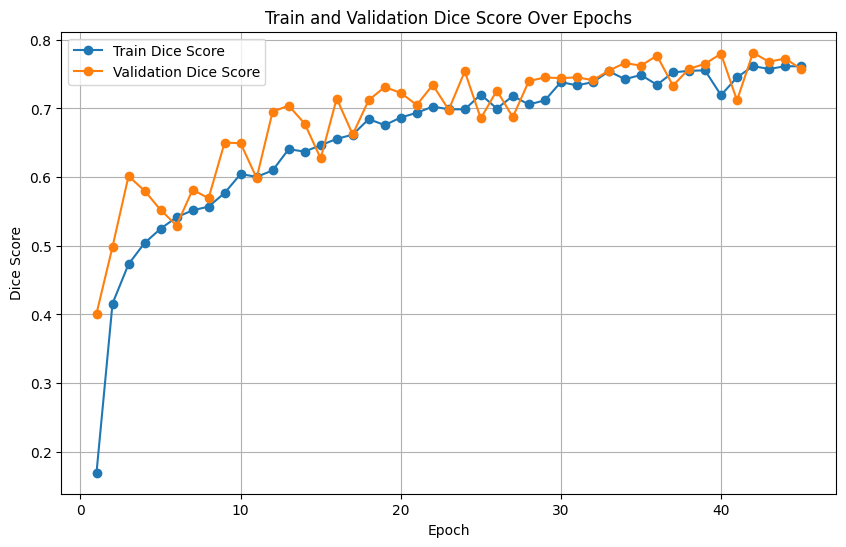

In [25]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming train_dice_scores and val_dice_scores are lists
train_dice_scores = [score.cpu().numpy() if isinstance(score, torch.Tensor) else score for score in train_dice_scores]
val_dice_scores = [score.cpu().numpy() if isinstance(score, torch.Tensor) else score for score in val_dice_scores]

plt.figure(figsize=(10, 6))
plt.plot(range(1, epochs+1), train_dice_scores, label='Train Dice Score', marker='o')
plt.plot(range(1, epochs+1), val_dice_scores, label='Validation Dice Score', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Dice Score')
plt.title('Train and Validation Dice Score Over Epochs')
plt.legend()
plt.grid(True)
plt.show()


In [26]:
# import matplotlib.pyplot as plt

# plt.figure(figsize=(14, 6))

# # Plotting loss
# plt.subplot(1, 2, 1)
# plt.plot(range(1, epochs+1), train_losses, label='Train Loss', marker='o')
# plt.plot(range(1, epochs+1), val_losses, label='Validation Loss', marker='o')
# plt.xlabel('Epoch')
# plt.ylabel('Loss')
# plt.title('Train and Validation Loss Over Epochs')
# plt.legend()
# plt.grid(True)

# # Plotting dice score
# plt.subplot(1, 2, 2)
# plt.plot(range(1, epochs+1), train_dice_scores, label='Train Dice Score', marker='o')
# plt.plot(range(1, epochs+1), val_dice_scores, label='Validation Dice Score', marker='o')
# plt.xlabel('Epoch')
# plt.ylabel('Dice Score')
# plt.title('Train and Validation Dice Score Over Epochs')
# plt.legend()
# plt.grid(True)

# plt.tight_layout()
# plt.show()

In [27]:
# Train and val Dice score graph
# import matplotlib.pyplot as plt

# # Training and validation dice scores
# train_dice_scores = [0.3601454496383667, 0.5063185095787048, 0.5721981525421143, 0.606930136680603, 0.6051648259162903, 0.6604837775230408, 0.6753939986228943, 0.6880732774734497, 0.6775870323181152, 0.7188441753387451, 0.7075418829917908, 0.7324191927909851, 0.7376654744148254, 0.7179559469223022, 0.7374719977378845, 0.7324191927909851, 0.757477343082428, 0.7510677576065063, 0.7444616556167603, 0.7385457754135132, 0.7385457754135132, 0.7493987083435059, 0.7738638520240784, 0.7802166938781738, 0.7726879715919495, 0.777312695980072, 0.7750985026359558, 0.7732248902320862, 0.7732248902320862, 0.7847110629081726, 0.7874634861946106, 0.792547881603241, 0.7889600992202759, 0.7932665944099426, 0.8068137168884277, 0.7926033735275269, 0.8025055527687073, 0.7889600992202759, 0.8004987239837646, 0.7949960827827454, 0.8114501237869263]

# val_dice_scores = [0.3799065947532654, 0.597161591053009, 0.6572001576423645, 0.5819350481033325, 0.6795076727867126, 0.6928685903549194, 0.7080637812614441, 0.7435255646705627, 0.7064602971076965, 0.7150089740753174, 0.7611206769943237, 0.7748772501945496, 0.7581835985183716, 0.7307347059249878, 0.7034096717834473, 0.7784861922264099, 0.7784861922264099, 0.7037606239318848, 0.7830966114997864, 0.7623109817504883, 0.8005640506744385, 0.7748772501945496, 0.7748772501945496, 0.7895339727401733, 0.7895339727401733, 0.792827844619751, 0.792827844619751, 0.7832374572753906, 0.8004330396652222, 0.8051260113716125, 0.7986067533493042, 0.7920746803283691, 0.8098573088645935, 0.8051260113716125, 0.7980852127075195, 0.7910334467887878, 0.7991809248924255, 0.7914416193962097, 0.754772424697876]

# # Number of epochs
# epochs = range(1, min(len(train_dice_scores), len(val_dice_scores)) + 1)

# # Plotting
# plt.figure(figsize=(10, 6))
# plt.plot(epochs, train_dice_scores[:len(epochs)], label='Training Dice Score', marker='o', linestyle='-')
# plt.plot(epochs, val_dice_scores[:len(epochs)], label='Validation Dice Score', marker='o', linestyle='-')
# plt.title('Training and Validation Dice Scores')
# plt.xlabel('Epochs')
# plt.ylabel('Dice Score')
# plt.legend()
# plt.grid(True)
# plt.tight_layout()
# plt.show()


In [28]:
# training loss plot
# import matplotlib.pyplot as plt

# loss_values = [0.65, 0.209, 0.225, 0.0912, 0.104, 0.338, 0.179, 0.161, 0.18, 0.29, 0.177, 0.096, 0.18, 0.267, 0.094, 0.0752, 0.181, 0.184, 0.364, 0.29, 0.172, 0.101, 0.122, 0.337, 0.124, 0.218, 0.167, 0.101, 0.0799, 0.131, 0.218, 0.0773, 0.124, 0.162, 0.0592, 0.184, 0.243, 0.209, 0.143]

# epochs = range(1, len(loss_values) + 1)

# plt.plot(epochs, loss_values, 'bo-', label='Training loss')
# plt.title('Training Loss')
# plt.xlabel('Epochs')
# plt.ylabel('Loss')
# plt.legend()

# plt.show()


In [29]:
import torch
torch.save(net.state_dict(), 'speed_breaker_weights.pth')


In [30]:
# #plot an full image # previous
# i=0
# with torch.no_grad():
#     for images ,masks in val_loader :
#         images = images.to(device)
#         masks  = masks.to(device)
        
# #         plt.imshow(images)
# #         plt.imshow(masks)
        
#         mask_pred = net(images)
        
#         img = images.cpu().numpy() 
#         masks = masks.cpu().numpy()
#         pred = mask_pred.cpu().numpy()
#         masks_2 = (pred > 0).astype(bool)
        
#         fig, axes = plt.subplots(1, 4, figsize=(20, 20))
        
#         axes[0].imshow(img[0][0])
#         axes[0].set_title('Actual img')
        
#         axes[1].imshow(masks[0][0])
#         axes[1].set_title('Ground Truth Mask')
        
#         axes[2].imshow(pred[0][0])
#         axes[2].set_title('Prababilistic Mask')
        
#         axes[3].imshow(masks_2[0][0])
#         axes[3].set_title('Probabilistic Mask threshold')
        
#         print()
#         if i==10:
#             break
#         i=i+1

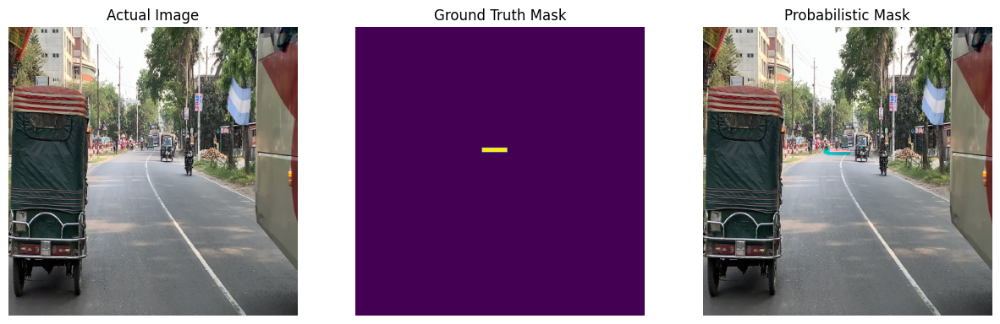

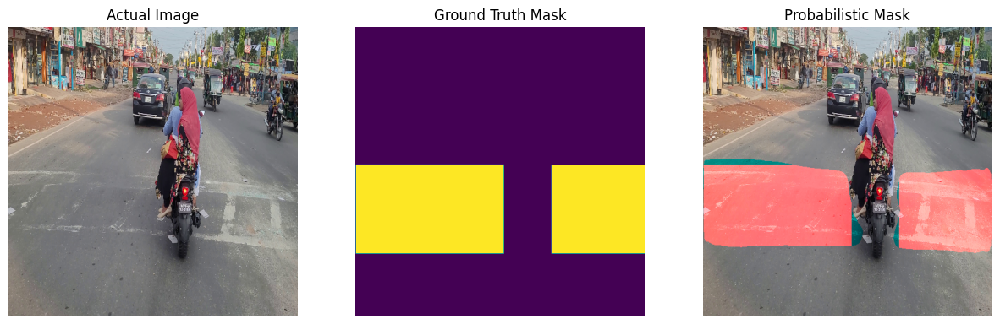

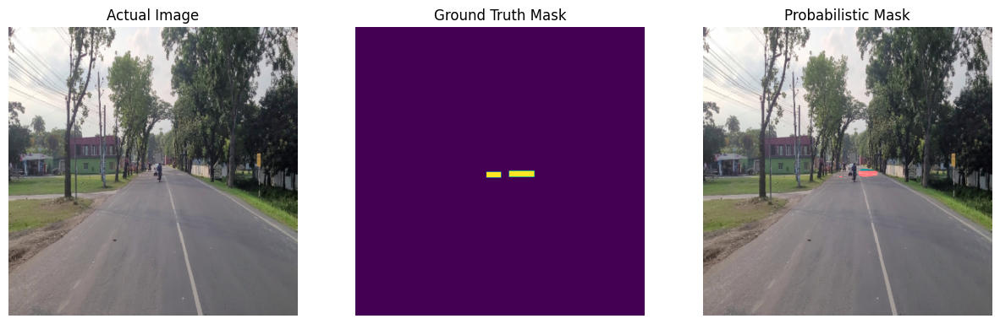

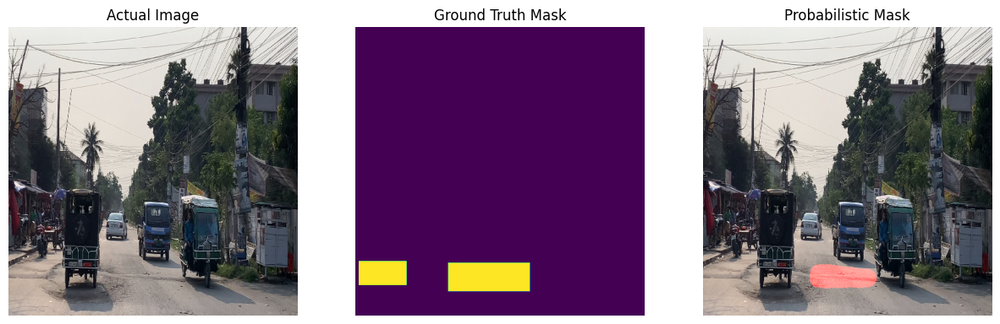

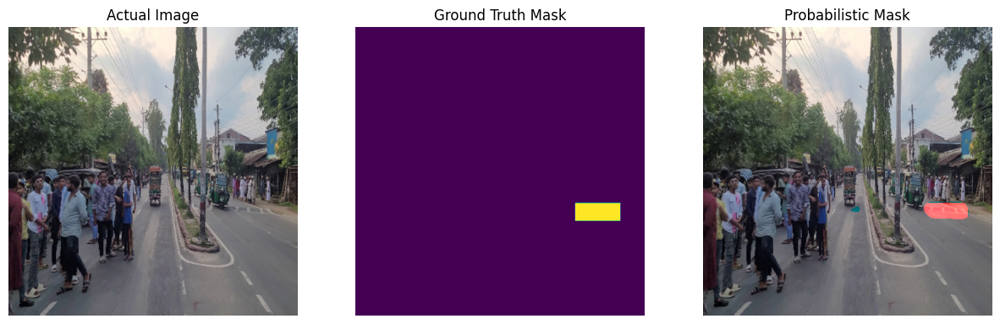

...

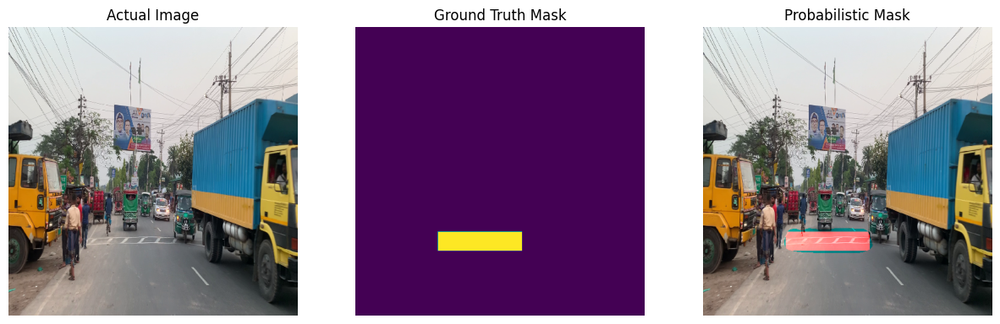

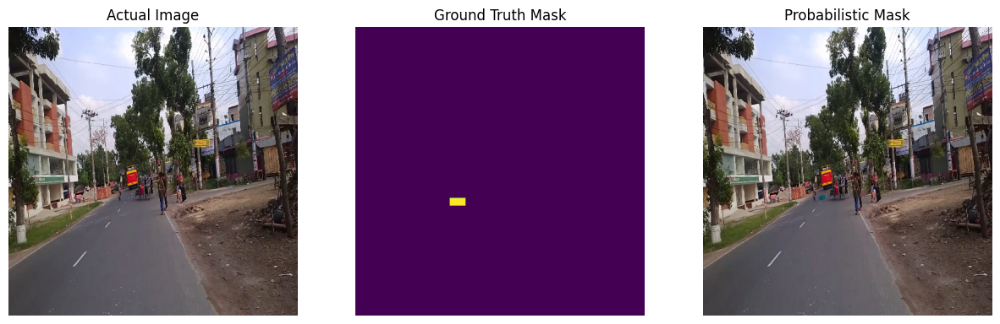

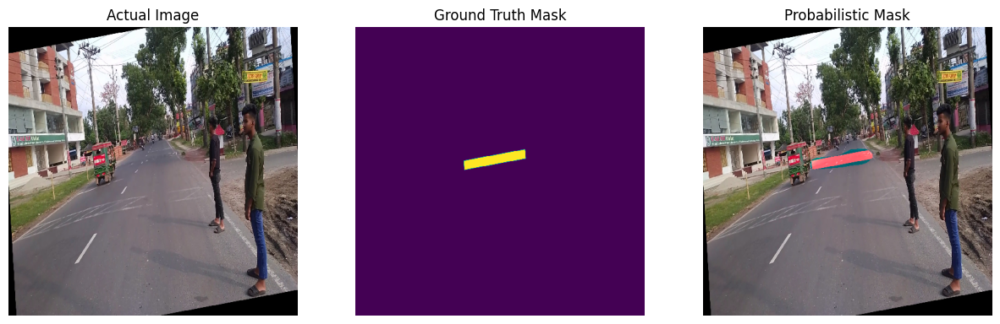

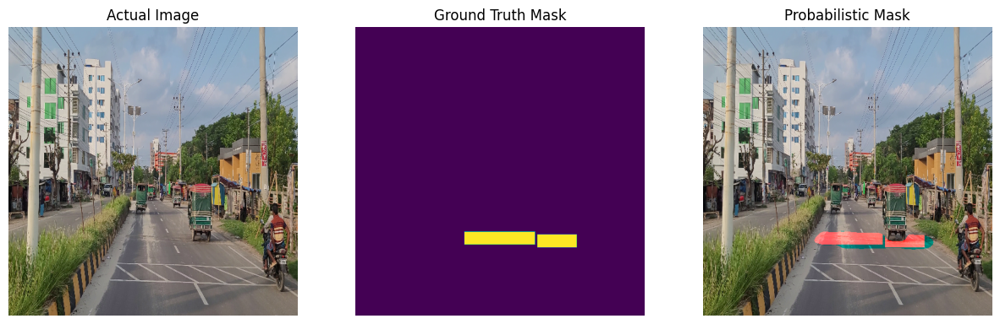

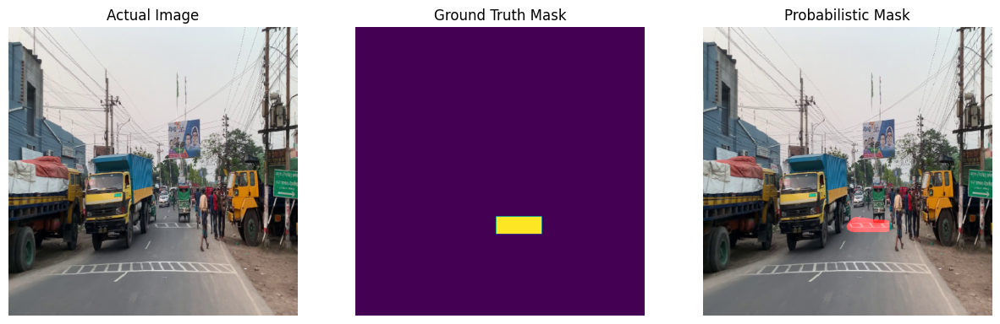

In [31]:
# Plot a full image # new
i = 0
with torch.no_grad():
    for images, masks in val_loader:
        images = images.to(device)
        masks = masks.to(device)

        mask_pred = net(images)

        img = images.cpu().numpy()
        masks = masks.cpu().numpy()
        pred = mask_pred.cpu().numpy()
        masks_2 = (pred > 0).astype(bool)

        # Denormalize the images
        denormalized_img = img * np.array(std)[:, np.newaxis, np.newaxis] + np.array(mean)[:, np.newaxis, np.newaxis]

        # Merge denormalized image with mask image
        merged_img = denormalized_img.copy()  # Make a copy to preserve the original image
        mask_area = masks_2[0][0].astype(int)  # Convert boolean mask to integers

        # Replace the pixels of the denormalized image with the mask image where the mask is present
        merged_img[0][0][mask_area == 1] = masks[0][0][mask_area == 1]

        fig, axes = plt.subplots(1, 3, figsize=(15, 15))

        axes[0].imshow(denormalized_img[0].transpose(1, 2, 0))  # Transpose to (H, W, C) for displaying
        axes[0].set_title('Actual Image')
        axes[0].axis('off')  # Remove axis labels

        axes[1].imshow(masks[0][0])
        axes[1].set_title('Ground Truth Mask')
        axes[1].axis('off')  # Remove axis labels

        axes[2].imshow(merged_img[0].transpose(1, 2, 0))
        axes[2].set_title('Probabilistic Mask')
        axes[2].axis('off')  # Remove axis labels

        plt.show()  # Show the plot
        print()
        if i == 10:
            break
        i = i + 1


In [32]:
# #plot a patch only
# import torch
# import matplotlib.pyplot as plt

# # Assuming net is your trained model and val_loader is your validation data loader

# with torch.no_grad():
#     for images, masks in val_loader:
#         images = images.to(device)
#         masks = masks.to(device)

#         # Perform patch-wise predictions
#         batch_size, num_patches, num_channels, height, width = images.shape
#         images = images.view(-1, num_channels, height, width)
#         masks = masks.view(-1, 1, height, width)
        
#         mask_pred = net(images)
#         mask_pred = mask_pred.view(batch_size, num_patches, 1, height, width)

#         # Aggregate patch-wise predictions into a single mask for the entire image
#         aggregated_mask_pred = mask_pred.max(dim=1)[0]  # You can choose other aggregation methods based on your use case
        
#         img = images.cpu().numpy()[0][0]
#         masks_gt = masks.cpu().numpy()[0][0]
#         masks_pred = aggregated_mask_pred.cpu().numpy()[0][0]
#         masks_thresholded = (masks_pred > 0.5).astype(int)  # Adjust the threshold as needed
        
#         fig, axes = plt.subplots(1, 4, figsize=(20, 20))

#         axes[0].imshow(img, cmap='gray')
#         axes[0].set_title('Actual img')

#         axes[1].imshow(masks_gt, cmap='gray')
#         axes[1].set_title('Ground Truth Mask')

#         axes[2].imshow(masks_pred, cmap='gray')
#         axes[2].set_title('Predicted Mask')

#         axes[3].imshow(masks_thresholded, cmap='gray')
#         axes[3].set_title('Thresholded Mask')
        
#         plt.show()
#         break


In [33]:
# import torch
# import torch.nn as nn
# from torchvision import transforms
# from PIL import Image
# import numpy as np
# import matplotlib.pyplot as plt

# # Define the UNet architecture
# class UNet(nn.Module):
#     def __init__(self, n_channels, n_classes, bilinear=True):
#         super(UNet, self).__init__()
#         # Define your architecture here
    
#     def forward(self, x):
#         # Define the forward pass here
#         return x

# # Load the trained model weights
# model_path = "/kaggle/input/weights/speed_breaker_weights.pth"
# model = UNet(n_channels=3, n_classes=1)  # Assuming the model architecture is defined properly
# model.load_state_dict(torch.load(model_path))
# model.eval()  # Set model to evaluation mode

# # Preprocess the input image
# image_path = "/kaggle/input/speed-breaker-dataset/FULL DATASET/Background/images/1.png"
# input_image = Image.open(image_path).convert("RGB")

# # Define transformations to apply to the input image
# transform = transforms.Compose([
#     transforms.Resize((512, 512)),  # Resize to match the input size expected by the model
#     transforms.ToTensor(),  # Convert PIL image to PyTorch tensor
#     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),  # Normalize
# ])

# # Apply transformations
# input_tensor = transform(input_image)
# input_tensor = input_tensor.unsqueeze(0)  # Add batch dimension

# # Perform inference
# with torch.no_grad():
#     input_tensor = input_tensor.to(device)  # Move input tensor to appropriate device (CPU/GPU)
#     output_mask = model(input_tensor)  # Forward pass
#     predicted_mask = torch.sigmoid(output_mask) > 0.5  # Apply thresholding

# # Convert the predicted mask tensor to numpy array
# predicted_mask_np = predicted_mask.squeeze().cpu().numpy()

# # Visualize the input image and the predicted segmentation mask
# plt.figure(figsize=(12, 6))
# plt.subplot(1, 2, 1)
# plt.imshow(input_image)
# plt.title("Input Image")
# plt.axis("off")

# plt.subplot(1, 2, 2)
# plt.imshow(predicted_mask_np, cmap='gray')
# plt.title("Predicted Segmentation Mask")
# plt.axis("off")

# plt.show()


In [34]:
# #plot an full image test #previous
# i=0
# with torch.no_grad():
#     for images ,masks in test_loader :
#         images = images.to(device)
#         masks  = masks.to(device)

#         mask_pred = net(images)
        
#         img = images.cpu().numpy() 
#         masks = masks.cpu().numpy()
#         pred = mask_pred.cpu().numpy()
#         masks_2 = (pred > 0).astype(bool)
        
#         fig, axes = plt.subplots(1, 4, figsize=(20, 20))
        
#         axes[0].imshow(img[0][0])
#         axes[0].set_title('Actual img')
        
#         axes[1].imshow(masks[0][0])
#         axes[1].set_title('Ground Truth Mask')
        
#         axes[2].imshow(pred[0][0])
#         axes[2].set_title('Prababilistic Mask')
        
#         axes[3].imshow(masks_2[0][0])
#         axes[3].set_title('Probabilistic Mask threshold')
        
#         print()
#         if i==10:
#             break
#         i=i+1

Dice and iou
        running_DS = dice_calc(masks, mask_pred)
        dice_score += running_DS
        running_IOU = iou_calc(masks, mask_pred)
        iou_score += running_IOU

In [35]:
# Assuming you already have a test dataset and you need to create a DataLoader for it
# Assuming you've defined the necessary transforms for test data as well

# # Define the test dataset
# test_set = Dataset_create(IMAGE_PATH, MASK_PATH, X_test, mean, std, t_val, patch=False)

# # Create the test DataLoader
# test_loader = DataLoader(test_set, batch_size=4, shuffle=False)

# Evaluation loop
def test_evaluation(tloader, patch=False):
    net.eval()
    #tloader.set_description('Testing')
    
    dice_score = 0
    iou_score = 0
    
    with torch.no_grad():
        for images, masks in tloader:
            images = images.to(device)
            masks = masks.to(device)
            
            if patch:
                # Perform patch-wise testing
                batch_size, num_patches, num_channels, height, width = images.shape
                images = images.view(-1, num_channels, height, width)
                masks = masks.view(-1, 1, height, width)
                
            mask_pred = net(images)
            
            running_DS = dice_calc(masks, mask_pred)
            dice_score += running_DS
            running_IOU = iou_calc(masks, mask_pred)
            iou_score += running_IOU
            
            #tloader.set_postfix(dice_score=running_DS.item(), iou_score=running_IOU.item())
    print(f'Total Test Dice Score: {dice_score}')
    print(f'Test Dice Score: {dice_score / len(tloader)}')
    print(f'Test IoU Score: {iou_score / len(tloader)}')

# Call the test evaluation function
test_evaluation(test_loader, patch=False)


Total Test Dice Score: 34.98780822753906
Test Dice Score: 0.7606045603752136
Test IoU Score: 0.628411591053009


In [36]:
# #plot for bg test

# #plot an full image test
# i=0
# with torch.no_grad():
#     for images ,masks in bg_test_loader :
#         images = images.to(device)
#         masks  = masks.to(device)

#         mask_pred = net(images)
        
#         img = images.cpu().numpy() 
#         masks = masks.cpu().numpy()
#         pred = mask_pred.cpu().numpy()
#         masks_2 = (pred > 0).astype(bool)
        
#         fig, axes = plt.subplots(1, 4, figsize=(20, 20))
        
#         axes[0].imshow(img[0][0])
#         axes[0].set_title('Actual img')
        
#         axes[1].imshow(masks[0][0])
#         axes[1].set_title('Ground Truth Mask')
        
#         axes[2].imshow(pred[0][0])
#         axes[2].set_title('Prababilistic Mask')
        
#         axes[3].imshow(masks_2[0][0])
#         axes[3].set_title('Probabilistic Mask threshold')
        
#         print()
#         if i==10:
#             break
#         i=i+1

In [37]:
#for no speed breaker (background)

i = 0
# Evaluation loop
def test_evaluation(tloader, patch=False):
    net.eval()
    #tloader.set_description('Testing')
    
    dice_score = 0
    iou_score = 0
    
    with torch.no_grad():
        for images, masks in tloader:
            images = images.to(device)
            masks = masks.to(device)
            
            if patch:
                # Perform patch-wise testing
                batch_size, num_patches, num_channels, height, width = images.shape
                images = images.view(-1, num_channels, height, width)
                masks = masks.view(-1, 1, height, width)
                
            mask_pred = net(images)
            running_DS = dice_calc(masks, mask_pred)
            dice_score += running_DS
            running_IOU = iou_calc(masks, mask_pred)
            iou_score += running_IOU
            
            #tloader.set_postfix(dice_score=running_DS.item(), iou_score=running_IOU.item())
#             if i < 10:
#                 print(running_DS)
#                 i = i+1
    print(f'Total BG Test Dice Score: {dice_score}')
    print(f'Test Dice Score: {dice_score / len(tloader)}')
    print(f'Test IoU Score: {iou_score / len(tloader)}')

# Call the test evaluation function
test_evaluation(bg_test_loader, patch=False)
print(len(bg_test_loader))


Total BG Test Dice Score: 0.0
Test Dice Score: 0.0
Test IoU Score: 0.0
46


In [38]:
#save test image
import os

# Create a directory to save the images if it doesn't exist
save_dir = 'saved_images'
os.makedirs(save_dir, exist_ok=True)

i = 0
with torch.no_grad():
    for images, masks in bg_test_loader:
        images = images.to(device)
        masks = masks.to(device)

        mask_pred = net(images)

        img = images.cpu().numpy()
        masks = masks.cpu().numpy()
        pred = mask_pred.cpu().numpy()
        masks_2 = (pred > 0).astype(bool)

        fig, axes = plt.subplots(1, 4, figsize=(20, 20))

        axes[0].imshow(img[0][0])
        axes[0].set_title('Actual img')
        axes[0].axis('off')  # Remove axis labels

        
        axes[1].imshow(masks[0][0])
        axes[1].set_title('Ground Truth Mask')
        axes[1].axis('off')  # Remove axis labels
        
        axes[2].imshow(pred[0][0])
        axes[2].set_title('Prababilistic Mask')
        axes[2].axis('off')  # Remove axis labels


        axes[3].imshow(masks_2[0][0])
        axes[3].set_title('Probabilistic Mask threshold')
        axes[3].axis('off')  # Remove axis labels


        # Save the figure as a PNG file
        if(i < 10):
            fig.savefig(os.path.join(save_dir, f'image_{i}.png'))

        plt.close(fig)  # Close the figure to release memory

        i += 1


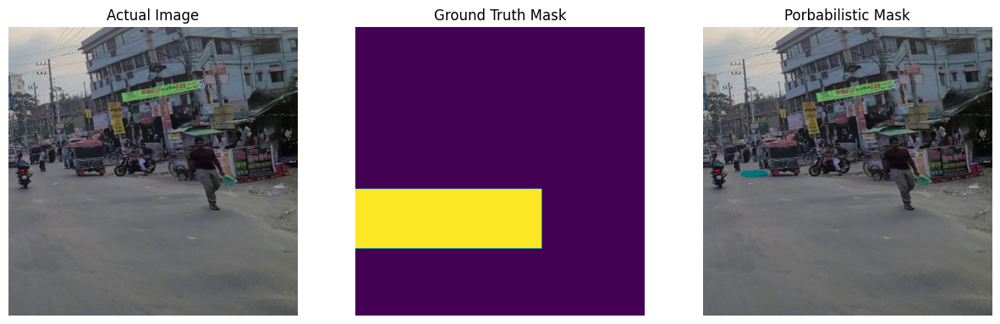

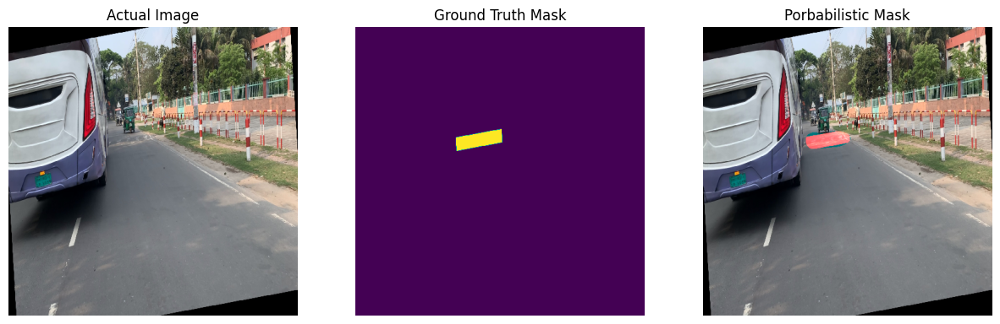

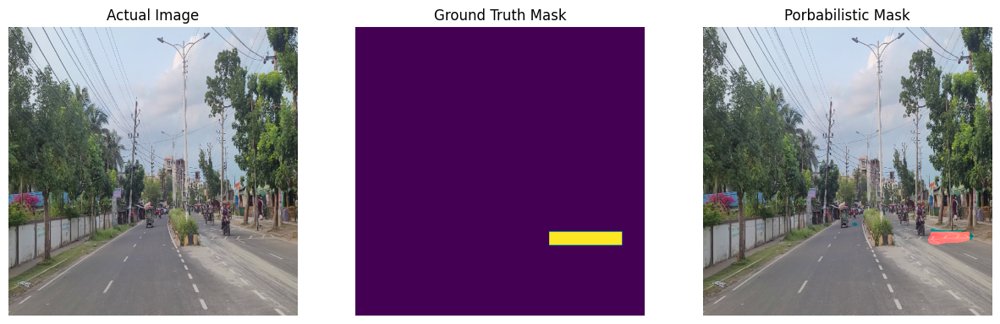

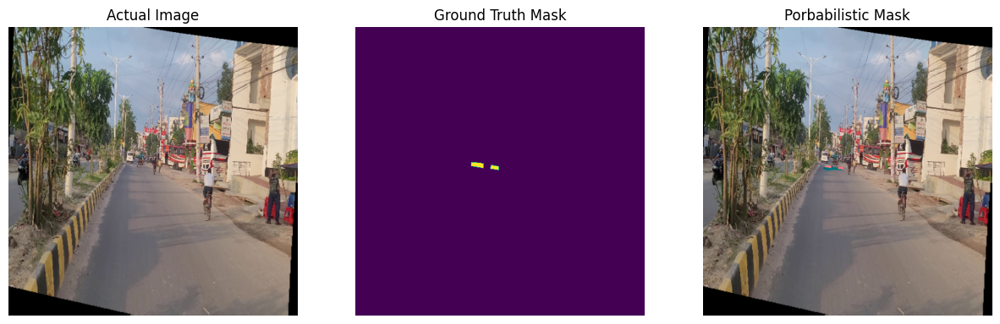

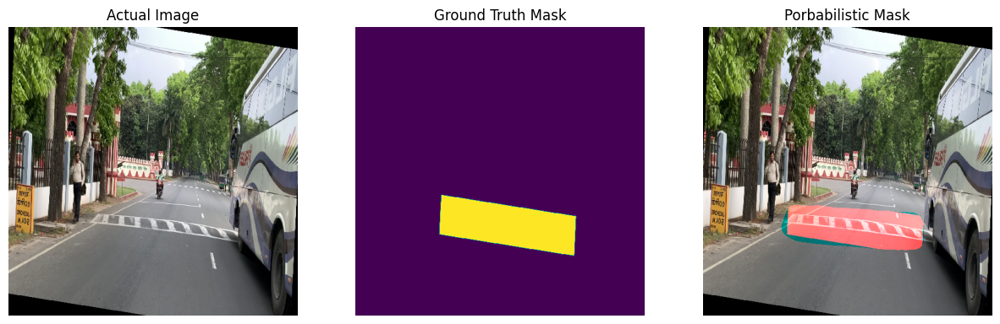

...

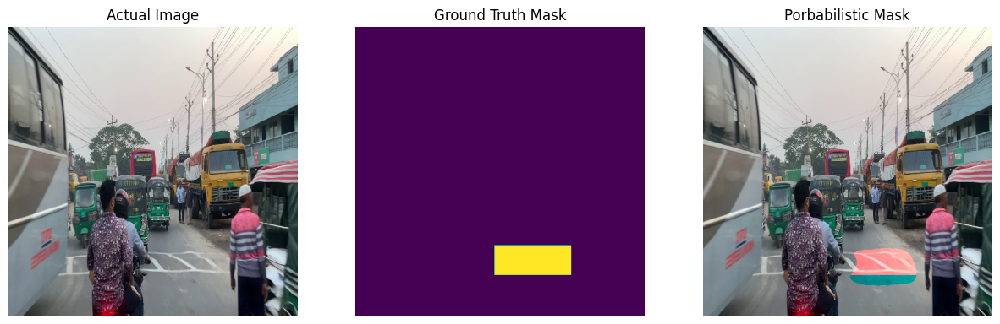

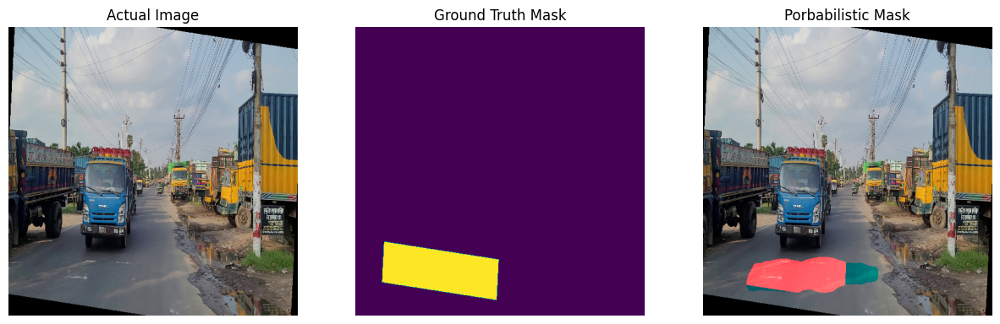

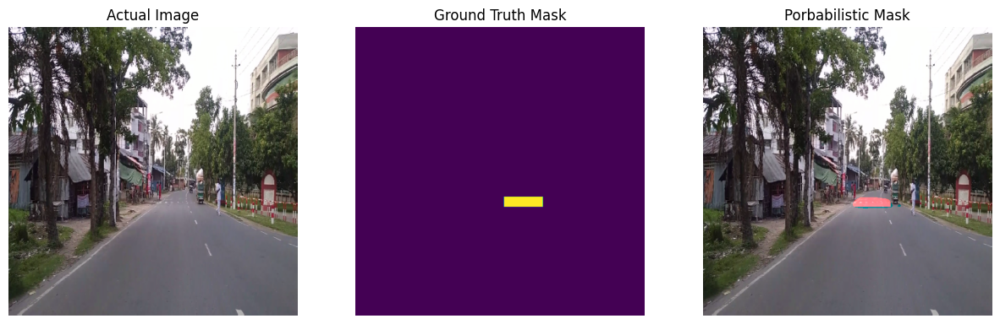

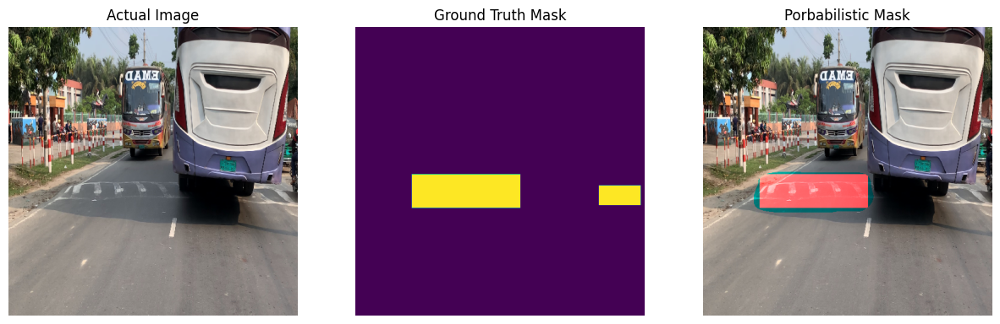

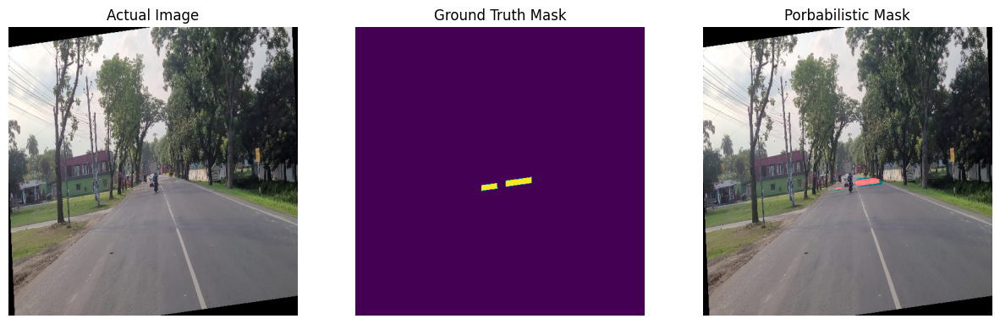

In [39]:
# Plot image with probabilistic mask for test_set
i = 0
with torch.no_grad():
    for images, masks in test_loader:
        images = images.to(device)
        masks = masks.to(device)

        mask_pred = net(images)

        img = images.cpu().numpy()
        masks = masks.cpu().numpy()
        pred = mask_pred.cpu().numpy()
        masks_2 = (pred > 0).astype(bool)

        # Denormalize the images
        denormalized_img = img * np.array(std)[:, np.newaxis, np.newaxis] + np.array(mean)[:, np.newaxis, np.newaxis]

        # Merge denormalized image with mask image
        merged_img = denormalized_img.copy()  # Make a copy to preserve the original image
        mask_area = masks_2[0][0].astype(int)  # Convert boolean mask to integers

        # Replace the pixels of the denormalized image with the mask image where the mask is present
        merged_img[0][0][mask_area == 1] = masks[0][0][mask_area == 1]

        fig, axes = plt.subplots(1, 3, figsize=(15, 15))

        axes[0].imshow(denormalized_img[0].transpose(1, 2, 0))  # Transpose to (H, W, C) for displaying
        axes[0].set_title('Actual Image')
        axes[0].axis('off')  # Remove axis labels

        axes[1].imshow(masks[0][0])
        axes[1].set_title('Ground Truth Mask')
        axes[1].axis('off')  # Remove axis labels

        axes[2].imshow(merged_img[0].transpose(1, 2, 0))
        axes[2].set_title('Porbabilistic Mask')
        axes[2].axis('off')  # Remove axis labels

        plt.show()  # Show the plot
        print()
        if i == 10:
            break
        i = i + 1


In [40]:
#save images
import os

# Define the output directory
output_dir = '/kaggle/working/output/'

# Create the output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

# Plot image with probabilistic mask for test_set and save
i = 0
with torch.no_grad():
    for images, masks in test_loader:
        images = images.to(device)
        masks = masks.to(device)

        mask_pred = net(images)

        img = images.cpu().numpy()
        masks = masks.cpu().numpy()
        pred = mask_pred.cpu().numpy()
        masks_2 = (pred > 0).astype(bool)

        # Denormalize the images
        denormalized_img = img * np.array(std)[:, np.newaxis, np.newaxis] + np.array(mean)[:, np.newaxis, np.newaxis]

        # Merge denormalized image with mask image
        merged_img = denormalized_img.copy()  # Make a copy to preserve the original image
        mask_area = masks_2[0][0].astype(int)  # Convert boolean mask to integers

        # Replace the pixels of the denormalized image with the mask image where the mask is present
        merged_img[0][0][mask_area == 1] = masks[0][0][mask_area == 1]

        # Plot figures without blank regions
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # Adjust the layout to 1 row and 3 columns
        fig.subplots_adjust(wspace=0)  # Set the padding between subplots to zero

        axes[0].imshow(denormalized_img[0].transpose(1, 2, 0))  # Transpose to (H, W, C) for displaying
        axes[0].set_title('Actual Image')
        axes[0].axis('off')  # Remove axis labels

        axes[1].imshow(masks[0][0])
        axes[1].set_title('Ground Truth Mask')
        axes[1].axis('off')  # Remove axis labels

        axes[2].imshow(merged_img[0].transpose(1, 2, 0))
        axes[2].set_title('Porbabilistic Mask')
        axes[2].axis('off')  # Remove axis labels

        # Save the figures without extra blank regions
        plt.savefig(os.path.join(output_dir, f'image_{i}.png'), bbox_inches='tight', pad_inches=0)  # Save the figure with a unique name
        plt.close()  # Close the figure to free up memory

        i = i + 1


In [41]:
# #for testing

# net=smp.Unet('efficientnet-b3', encoder_weights='imagenet', classes=1, activation=None, encoder_depth=5, decoder_channels=[ 256, 128, 64, 32, 16])

# # import segmentation_models_pytorch as smp

# # net = smp.Unet(
# #     'efficientnet-b3',
# #     encoder_weights='imagenet',
# #     classes=1,
# #     activation='sigmoid',  # Set activation to 'sigmoid' for binary classification
# #     encoder_depth=5,
# #     decoder_channels=[256, 128, 64, 32, 16]
# # )
# pretrain = True
# if pretrain:
# # Load the saved weights
#     net.load_state_dict(torch.load('/kaggle/input/weights-1/speed_breaker_weights 1.pth'))
# #net = UNet(n_channels=3, n_classes=1, bilinear=True)
# net.to(device=device)

In [42]:
# #for background save test
# import os
# import zipfile

# # Define the output directory
# output_dir = '/kaggle/working/output/'

# # Create the output directory if it doesn't exist
# os.makedirs(output_dir, exist_ok=True)

# # Create a zip file
# zip_file_path = '/kaggle/working/output/bg_images.zip'
# with zipfile.ZipFile(zip_file_path, 'w') as zip_file:
#     # Plot image with probabilistic mask for test_set and save
#     i = 0
#     with torch.no_grad():
#         for images, masks in bg_test_loader:
#             images = images.to(device)
#             masks = masks.to(device)

#             mask_pred = net(images)

#             img = images.cpu().numpy()
#             masks = masks.cpu().numpy()
#             pred = mask_pred.cpu().numpy()
#             masks_2 = (pred > 0).astype(bool)

#             # Denormalize the images
#             denormalized_img = img * np.array(std)[:, np.newaxis, np.newaxis] + np.array(mean)[:, np.newaxis, np.newaxis]

#             # Merge denormalized image with mask image
#             merged_img = denormalized_img.copy()  # Make a copy to preserve the original image
#             mask_area = masks_2[0][0].astype(int)  # Convert boolean mask to integers

#             # Replace the pixels of the denormalized image with the mask image where the mask is present
#             merged_img[0][0][mask_area == 1] = masks[0][0][mask_area == 1]

#             fig, axes = plt.subplots(1, 3, figsize=(20, 6))  # Adjust the figure size
#             fig.subplots_adjust(wspace=0.3)  # Adjust the horizontal space between subplots

#             axes[0].imshow(denormalized_img[0].transpose(1, 2, 0))  # Transpose to (H, W, C) for displaying
#             axes[0].set_title('Actual Image')
#             axes[0].axis('off')  # Remove axis labels

#             axes[1].imshow(masks[0][0])
#             axes[1].set_title('Ground Truth Mask')
#             axes[1].axis('off')  # Remove axis labels

#             axes[2].imshow(merged_img[0].transpose(1, 2, 0))
#             axes[2].set_title('Probabilistic Mask')
#             axes[2].axis('off')  # Remove axis labels

#             # Save the figures
#             plt.savefig(os.path.join(output_dir, f'image_{i}.png'), bbox_inches='tight')  # Save the figure with a unique name
#             plt.close()  # Close the figure to free up memory

#             # Add the image file to the zip file
#             zip_file.write(os.path.join(output_dir, f'image_{i}.png'), f'image_{i}.png')

#             i = i + 1

# # Print the path to the zip file
# print(f'Images saved in zip file: {zip_file_path}')


In [43]:
#for speedbreaker save test
import os
import zipfile

# Define the output directory
output_dir = '/kaggle/working/output/'

# Create the output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

# Create a zip file
zip_file_path = '/kaggle/working/output/images.zip'
with zipfile.ZipFile(zip_file_path, 'w') as zip_file:
    # Plot image with probabilistic mask for test_set and save
    i = 0
    with torch.no_grad():
        for images, masks in test_loader:
            images = images.to(device)
            masks = masks.to(device)

            mask_pred = net(images)

            img = images.cpu().numpy()
            masks = masks.cpu().numpy()
            pred = mask_pred.cpu().numpy()
            masks_2 = (pred > 0).astype(bool)

            # Denormalize the images
            denormalized_img = img * np.array(std)[:, np.newaxis, np.newaxis] + np.array(mean)[:, np.newaxis, np.newaxis]

            # Merge denormalized image with mask image
            merged_img = denormalized_img.copy()  # Make a copy to preserve the original image
            mask_area = masks_2[0][0].astype(int)  # Convert boolean mask to integers

            # Replace the pixels of the denormalized image with the mask image where the mask is present
            merged_img[0][0][mask_area == 1] = masks[0][0][mask_area == 1]

            fig, axes = plt.subplots(1, 3, figsize=(20, 6))  # Adjust the figure size
            fig.subplots_adjust(wspace=0.2)  # Adjust the horizontal space between subplots

            axes[0].imshow(denormalized_img[0].transpose(1, 2, 0))  # Transpose to (H, W, C) for displaying
            axes[0].set_title('Actual Image')
            axes[0].axis('off')  # Remove axis labels

            axes[1].imshow(masks[0][0])
            axes[1].set_title('Ground Truth Mask')
            axes[1].axis('off')  # Remove axis labels

            axes[2].imshow(merged_img[0].transpose(1, 2, 0))
            axes[2].set_title('Probabilistic Mask')
            axes[2].axis('off')  # Remove axis labels

            # Save the figures
            plt.savefig(os.path.join(output_dir, f'image_{i}.png'), bbox_inches='tight')  # Save the figure with a unique name
            plt.close()  # Close the figure to free up memory

            # Add the image file to the zip file
            zip_file.write(os.path.join(output_dir, f'image_{i}.png'), f'image_{i}.png')
            
            i = i + 1

# Print the path to the zip file
print(f'Images saved in zip file: {zip_file_path}')



Images saved in zip file: /kaggle/working/output/images.zip


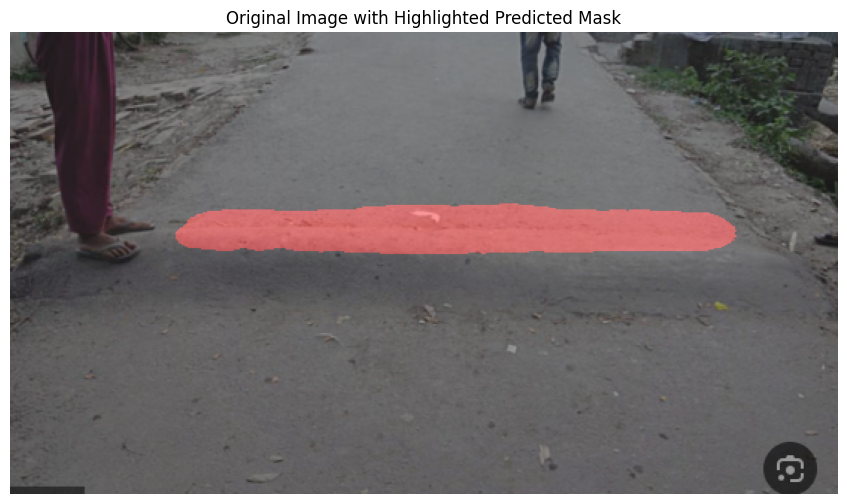

In [44]:
    # Create mask with given input image
    import numpy as np
    import matplotlib.pyplot as plt
    from PIL import Image
    import torch
    from torchvision import transforms as T
    import segmentation_models_pytorch as smp
    import cv2

    # Load the image
    image_path = "/kaggle/input/test-3/test1 flipped.PNG"
    image = Image.open(image_path).convert('RGB')

    # Preprocess the image
    transform = T.Compose([
        T.Resize((512, 512)),  # Resize to match the input size of your model
        T.ToTensor(),
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize with ImageNet mean and std
    ])
    input_image = transform(image)

    # Add batch dimension and move to appropriate device
    input_image = input_image.unsqueeze(0).to(device)

    # Perform inference
    with torch.no_grad():
        net.eval()
        output_mask = net(input_image)

    # Convert output mask to probabilistic mask
    probabilistic_mask = torch.sigmoid(output_mask)

    # Convert probabilistic mask to numpy array
    probabilistic_mask_np = probabilistic_mask.squeeze(0).squeeze(0).cpu().numpy()

    # Threshold the probabilistic mask to obtain a binary mask
    threshold = 0.5  # Adjust as needed
    binary_mask = (probabilistic_mask_np > threshold).astype(np.uint8)

    # Resize the binary mask to match the dimensions of the original image
    resized_binary_mask = cv2.resize(binary_mask, (image.width, image.height))

    # Overlay the predicted mask on the original image
    overlay = np.zeros_like(np.array(image))
    overlay[:,:,0] = resized_binary_mask * 255  # Use the binary mask as the red channel of the overlay

    # Blend the original image with the overlay
    alpha = 0.4  # Adjust the transparency
    masked_image = cv2.addWeighted(np.array(image), 1-alpha, overlay, alpha, 0)

    # Visualize the original image with the highlighted mask overlay
    plt.figure(figsize=(12, 6))
    plt.imshow(masked_image)
    plt.title('Original Image with Highlighted Predicted Mask')
    plt.axis('off')
    plt.show()
    
    
# #original image with original mask
# # Load the original mask
# original_mask_path = "/kaggle/input/speed-breaker-inc-augmentation/FULL DATASET (Inc Augmentation)/Speedbreaker/masks/1014.png"
# original_mask = Image.open(original_mask_path).convert('L')  # Convert to grayscale

# # Resize the original mask to match the dimensions of the original image
# original_mask = original_mask.resize((image.width, image.height))

# # Convert the original mask to a binary mask
# original_binary_mask = np.array(original_mask) > 0

# # Overlay the original binary mask on the original image
# original_overlay = np.zeros_like(np.array(image))
# original_overlay[:, :, 0] = original_binary_mask * 255  # Use the binary mask as the red channel of the overlay

# # Blend the original image with the original mask overlay
# original_masked_image = cv2.addWeighted(np.array(image), 1-alpha, original_overlay, alpha, 0)

# # Visualize the original image with the highlighted original mask overlay
# plt.figure(figsize=(12, 6))
# plt.imshow(original_masked_image)
# plt.title('Original Image with Highlighted Original Mask')
# plt.axis('off')
# plt.show()


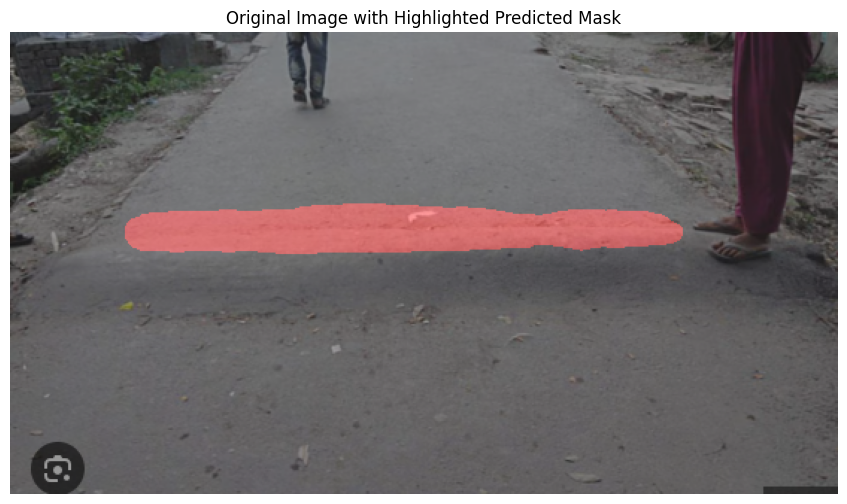

In [45]:
    # Create mask with given input image
    import numpy as np
    import matplotlib.pyplot as plt
    from PIL import Image
    import torch
    from torchvision import transforms as T
    import segmentation_models_pytorch as smp
    import cv2

    # Load the image
    image_path = "/kaggle/input/test-3/test1.PNG"
    image = Image.open(image_path).convert('RGB')

    # Preprocess the image
    transform = T.Compose([
        T.Resize((512, 512)),  # Resize to match the input size of your model
        T.ToTensor(),
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize with ImageNet mean and std
    ])
    input_image = transform(image)

    # Add batch dimension and move to appropriate device
    input_image = input_image.unsqueeze(0).to(device)

    # Perform inference
    with torch.no_grad():
        net.eval()
        output_mask = net(input_image)

    # Convert output mask to probabilistic mask
    probabilistic_mask = torch.sigmoid(output_mask)

    # Convert probabilistic mask to numpy array
    probabilistic_mask_np = probabilistic_mask.squeeze(0).squeeze(0).cpu().numpy()

    # Threshold the probabilistic mask to obtain a binary mask
    threshold = 0.5  # Adjust as needed
    binary_mask = (probabilistic_mask_np > threshold).astype(np.uint8)

    # Resize the binary mask to match the dimensions of the original image
    resized_binary_mask = cv2.resize(binary_mask, (image.width, image.height))

    # Overlay the predicted mask on the original image
    overlay = np.zeros_like(np.array(image))
    overlay[:,:,0] = resized_binary_mask * 255  # Use the binary mask as the red channel of the overlay

    # Blend the original image with the overlay
    alpha = 0.4  # Adjust the transparency
    masked_image = cv2.addWeighted(np.array(image), 1-alpha, overlay, alpha, 0)

    # Visualize the original image with the highlighted mask overlay
    plt.figure(figsize=(12, 6))
    plt.imshow(masked_image)
    plt.title('Original Image with Highlighted Predicted Mask')
    plt.axis('off')
    plt.show()
    
    
# #original image with original mask
# # Load the original mask
# original_mask_path = "/kaggle/input/speed-breaker-inc-augmentation/FULL DATASET (Inc Augmentation)/Speedbreaker/masks/1014.png"
# original_mask = Image.open(original_mask_path).convert('L')  # Convert to grayscale

# # Resize the original mask to match the dimensions of the original image
# original_mask = original_mask.resize((image.width, image.height))

# # Convert the original mask to a binary mask
# original_binary_mask = np.array(original_mask) > 0

# # Overlay the original binary mask on the original image
# original_overlay = np.zeros_like(np.array(image))
# original_overlay[:, :, 0] = original_binary_mask * 255  # Use the binary mask as the red channel of the overlay

# # Blend the original image with the original mask overlay
# original_masked_image = cv2.addWeighted(np.array(image), 1-alpha, original_overlay, alpha, 0)

# # Visualize the original image with the highlighted original mask overlay
# plt.figure(figsize=(12, 6))
# plt.imshow(original_masked_image)
# plt.title('Original Image with Highlighted Original Mask')
# plt.axis('off')
# plt.show()


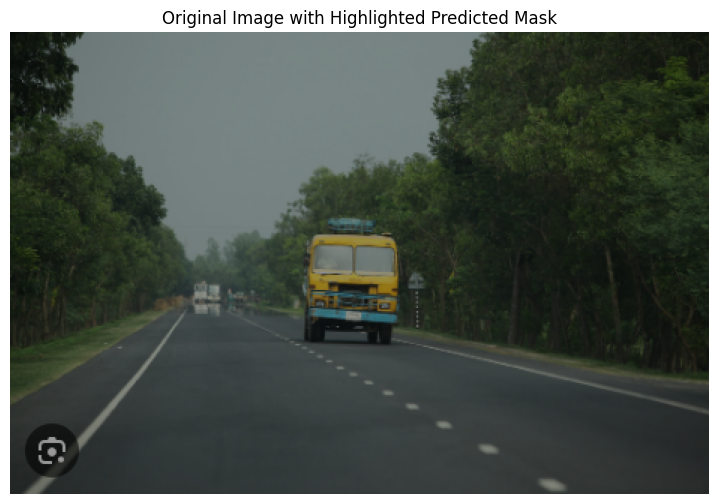

In [46]:
    # Create mask with given input image
    import numpy as np
    import matplotlib.pyplot as plt
    from PIL import Image
    import torch
    from torchvision import transforms as T
    import segmentation_models_pytorch as smp
    import cv2

    # Load the image
    image_path = "/kaggle/input/test-4/road.PNG"
    image = Image.open(image_path).convert('RGB')

    # Preprocess the image
    transform = T.Compose([
        T.Resize((512, 512)),  # Resize to match the input size of your model
        T.ToTensor(),
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize with ImageNet mean and std
    ])
    input_image = transform(image)

    # Add batch dimension and move to appropriate device
    input_image = input_image.unsqueeze(0).to(device)

    # Perform inference
    with torch.no_grad():
        net.eval()
        output_mask = net(input_image)

    # Convert output mask to probabilistic mask
    probabilistic_mask = torch.sigmoid(output_mask)

    # Convert probabilistic mask to numpy array
    probabilistic_mask_np = probabilistic_mask.squeeze(0).squeeze(0).cpu().numpy()

    # Threshold the probabilistic mask to obtain a binary mask
    threshold = 0.5  # Adjust as needed
    binary_mask = (probabilistic_mask_np > threshold).astype(np.uint8)

    # Resize the binary mask to match the dimensions of the original image
    resized_binary_mask = cv2.resize(binary_mask, (image.width, image.height))

    # Overlay the predicted mask on the original image
    overlay = np.zeros_like(np.array(image))
    overlay[:,:,0] = resized_binary_mask * 255  # Use the binary mask as the red channel of the overlay

    # Blend the original image with the overlay
    alpha = 0.4  # Adjust the transparency
    masked_image = cv2.addWeighted(np.array(image), 1-alpha, overlay, alpha, 0)

    # Visualize the original image with the highlighted mask overlay
    plt.figure(figsize=(12, 6))
    plt.imshow(masked_image)
    plt.title('Original Image with Highlighted Predicted Mask')
    plt.axis('off')
    plt.show()
    
    
# #original image with original mask
# # Load the original mask
# original_mask_path = "/kaggle/input/speed-breaker-inc-augmentation/FULL DATASET (Inc Augmentation)/Speedbreaker/masks/1014.png"
# original_mask = Image.open(original_mask_path).convert('L')  # Convert to grayscale

# # Resize the original mask to match the dimensions of the original image
# original_mask = original_mask.resize((image.width, image.height))

# # Convert the original mask to a binary mask
# original_binary_mask = np.array(original_mask) > 0

# # Overlay the original binary mask on the original image
# original_overlay = np.zeros_like(np.array(image))
# original_overlay[:, :, 0] = original_binary_mask * 255  # Use the binary mask as the red channel of the overlay

# # Blend the original image with the original mask overlay
# original_masked_image = cv2.addWeighted(np.array(image), 1-alpha, original_overlay, alpha, 0)

# # Visualize the original image with the highlighted original mask overlay
# plt.figure(figsize=(12, 6))
# plt.imshow(original_masked_image)
# plt.title('Original Image with Highlighted Original Mask')
# plt.axis('off')
# plt.show()
